In [1]:
import warnings; warnings.simplefilter('ignore')

import sys
sys.path.insert(0, '/home/jcbyts/Repos/')

import Utils as U
import gratings as gt


import NDN3.NDNutils as NDNutils

which_gpu = NDNutils.assign_gpu()

import os

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = str(0)

import tensorflow as tf

import neureye as ne
import NDN3.NDN as NDN
import NDN3.Utils.DanUtils as DU

output_dir = '/home/jcbyts/PyPlay/tensorboard' + str(which_gpu)
print(output_dir)

import numpy as np
from scipy.ndimage import gaussian_filter
from copy import deepcopy
import matplotlib.pyplot as plt  # plotting
import seaborn as sns


*******************************************************************************************
---> getting list of available GPUs:
[0, 1]

---> getting GPU memory map:
{0: 0, 1: 218}

---> setting up GPU with largest available memory:
   ...picking GPU # 0
*******************************************************************************************

Done!
/home/jcbyts/PyPlay/tensorboard0


In [17]:
dirname = '/home/jcbyts/Data/MitchellV1FreeViewing/stim_movies/'

# flist = ['logan_20200304_Gabor_0__0_40_40_2_1_1_9.mat',
#         'logan_20200304_Grating_0__0_40_40_2_1_1_9.mat']

# flist = ['logan_20200304_Gabor_-10__0_30_50_2_1_0_9_0.mat',
#          'logan_20200304_Grating_-10__0_30_50_2_1_0_9_0.mat']

# flist = ['logan_20200304_Gabor_-20_-10_40_60_2_1_0_9_0.mat',
#     'logan_20200304_Grating_-20_-10_40_60_2_1_0_9_0.mat',
#     'logan_20200304_FixRsvpStim_-20_-10_40_60_2_1_0_9_0.mat',
#     'logan_20200304_BackImage_-20_-10_40_60_2_1_0_9_0.mat']

flist = ['logan_20200304_Gabor_-20_-10_40_60_2_2_0_9_0.mat',
    'logan_20200304_Grating_-20_-10_40_60_2_2_0_9_0.mat',
    'logan_20200304_FixRsvpStim_-20_-10_40_60_2_2_0_9_0.mat',
    'logan_20200304_BackImage_-20_-10_40_60_2_2_0_9_0.mat']


# flist = ['logan_20200306_Gabor_-20_-10_40_60_2_2_0_9_0.mat',
#     'logan_20200306_Grating_-20_-10_40_60_2_2_0_9_0.mat',
#     'logan_20200306_FixRsvpStim_-20_-10_40_60_2_2_0_9_0.mat',
#     'logan_20200306_BackImage_-20_-10_40_60_2_2_0_9_0.mat']


import importlib
importlib.reload(ne)

<module 'neureye' from '/home/jcbyts/Repos/V1FreeViewingCode/Analysis/notebooks/neureye.py'>

In [18]:
# Load data
Stim,Robs,valdat,labels,NX,NY,dt,eyeAtFrame,frameTime = ne.load_stim_files(dirname=dirname, flist=flist[0:2], corrected=True)

Stim /= np.nanstd(Stim) # normalize stimulus (necessary?)


loading corrected [logan_20200304_Gabor_-20_-10_40_60_2_2_0_9_0C.mat]
loading corrected [logan_20200304_Grating_-20_-10_40_60_2_2_0_9_0C.mat]


In [19]:
# get valid indices
valdata = np.intersect1d(np.where(valdat[:,0] == 1)[0], np.where(labels[:,0] == 1)[0]) # fixations / valid

valid_eye_rad = 5.2  # degrees -- use this when looking at eye-calibration (see below)
ppd = 37.50476617061

eyeX = (eyeAtFrame[:,0]-640)/ppd
eyeY = (eyeAtFrame[:,1]-380)/ppd

eyeCentered = np.hypot(eyeX, eyeY) < valid_eye_rad
# eyeCentered = np.logical_and(eyeX < 0, eyeCentered)
valdata = np.intersect1d(valdata, np.where(eyeCentered)[0])

In [2]:
# quick check STAS
stas = ne.get_stas(Stim, Robs, [NX,NY], valid=valdata, num_lags=14, plot=False)

plt.figure(figsize=(10,10))
NC = Robs.shape[1]
sx,sy = U.get_subplot_dims(NC)
sumdensity = 0
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], (NY,NX)))
    sumdensity += np.abs(stas[:,bestlag,cc])
    plt.title(cc)
    plt.axis("off")
    
plt.figure()
plt.imshow(np.reshape(sumdensity, (NY, NX)))

NameError: name 'ne' is not defined

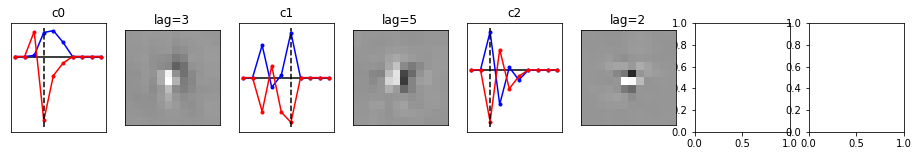

In [38]:
# import scipy.io as sio
# sio.savemat(dirname'logan_20200304_Gabor_STAs.mat', {'stas': stas})

nim0 = NDN.NDN.load_model('/home/jcbyts/Data/MitchellV1FreeViewing/cell38best.pkl')

DU.plot_3dfilters(nim0)

num_lags = nim0.networks[0].layers[0].input_dims[0]

Cxinds = ne.crop_indx(NX, range(9,24), range(9,24))
NX2 = np.sqrt(len(Cxinds)).astype(int)
Xstim, Rinds = ne.create_time_embedding_valid(Stim[:,Cxinds], [num_lags, NX2, NX2], valdata)

In [42]:
cc=38
Rinds.shape
R = deepcopy(Robs[Rinds,:])
R = R[:,cc]
NT = len(R)
Ui, Xi = NDNutils.generate_xv_folds(NT)
# nim0.network_list
# Xstim.shape

nim0.eval_models(input_data=Xstim, output_data=R, nulladjusted=True, data_indxs=Xi)

array([0.31129152])

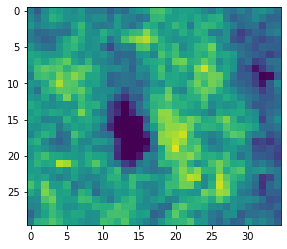

In [21]:
# 56, 23
cc = 34
bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
sta = stas[:,:,cc]
sta -= np.mean(sta)
sta /= np.max(sta)
I = np.reshape(sta[:,bestlag], (NY,NX))
plt.imshow(I, vmin=-1, vmax=1)#, cmap='coolwarm')
        

In [1]:
num_lags = stas.shape[1]
num_lags = 10
# plot individual units

for cc in [38]: #range(NC):
    plt.figure(figsize=(15,2))
    for ilag in range(num_lags):
        ax = plt.subplot(1,num_lags, ilag+1)
        sta = stas[:,:,cc]
#         sta = (sta - np.min(sta)) / (np.max(sta) - np.min(sta))
        sta -= np.mean(sta)
        sta /= np.max(sta)
        I = np.reshape(sta[:,ilag], (NY,NX))
        plt.imshow(I, vmin=-1, vmax=1)#, cmap='coolwarm')
        ax.set_xticks([])
        ax.set_yticks([])
#         plt.title(8.3*(ilag+1))
        

NameError: name 'stas' is not defined

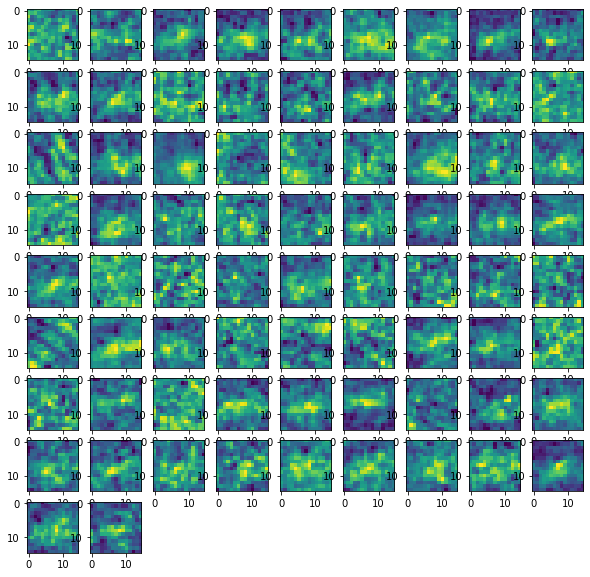

In [6]:
# get crop indices
# Cxinds = ne.crop_indx(NX, range(9,24), range(9,24))
Cxinds = ne.crop_indx(NX, range(5,20), range(5,20))
# Cxinds = ne.crop_indx(NX, range(20,44), range(20,44))
NX2 = np.sqrt(len(Cxinds)).astype(int)
plt.figure(figsize=(10,10))
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    sta = stas[:,bestlag,cc]
    plt.imshow(np.reshape(sta[Cxinds], [NX2,NX2]))

70655 valid samples of 141698 possible


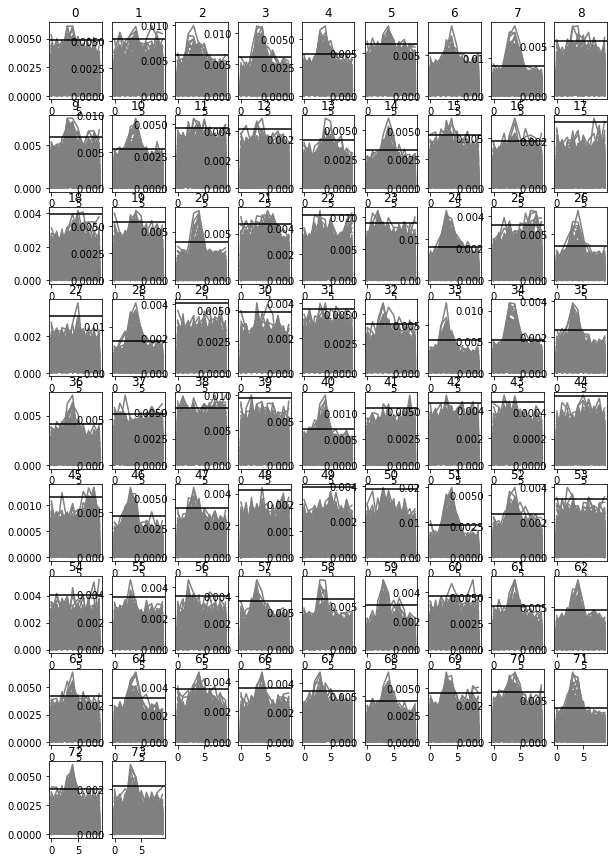

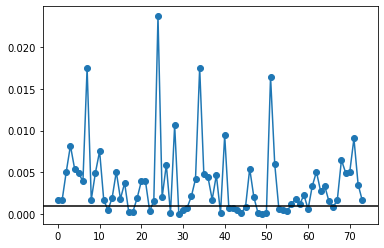

70655 valid samples of 141698 possible
52 good units


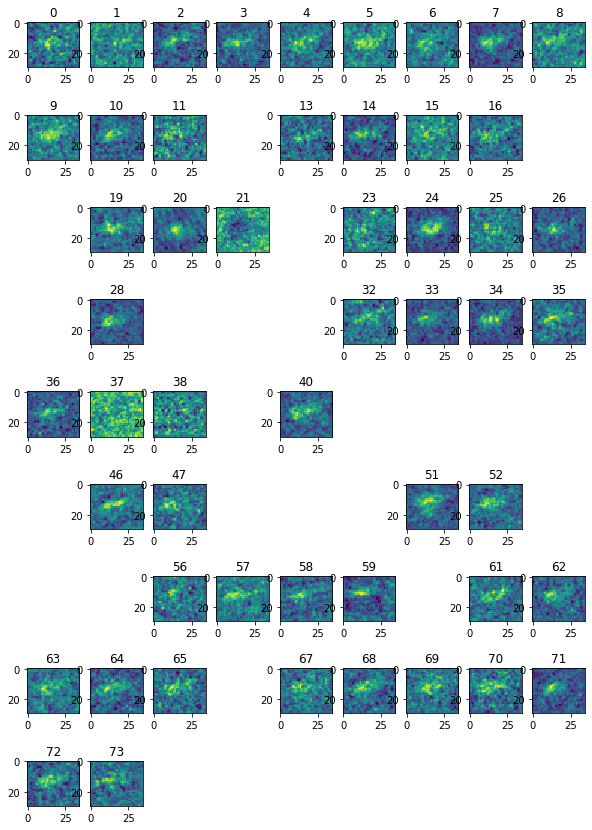

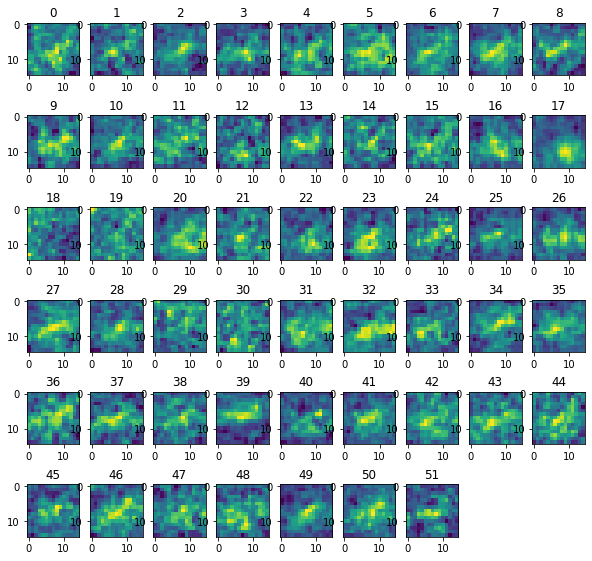

W0609 00:41:11.517758 140488328849216 deprecation_wrapper.py:119] From /home/jcbyts/Repos/NDN3/NDN.py:270: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

W0609 00:41:11.518956 140488328849216 deprecation_wrapper.py:119] From /home/jcbyts/Repos/NDN3/NDN.py:278: The name tf.set_random_seed is deprecated. Please use tf.compat.v1.set_random_seed instead.

W0609 00:41:11.519807 140488328849216 deprecation_wrapper.py:119] From /home/jcbyts/Repos/NDN3/NDN.py:281: The name tf.variable_scope is deprecated. Please use tf.compat.v1.variable_scope instead.

W0609 00:41:11.520638 140488328849216 deprecation_wrapper.py:119] From /home/jcbyts/Repos/NDN3/NDN.py:1108: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0609 00:41:11.528759 140488328849216 deprecation_wrapper.py:119] From /home/jcbyts/Repos/NDN3/layer.py:236: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead

Input dimensions: [1, 15, 15, 10]
0: normal (relu):  	[E18/I18] N
1: normal (relu):  	[E12/I12] N+
0: normal (softplus):  	[E52/I0] N


W0609 00:41:12.007456 140488328849216 deprecation_wrapper.py:119] From /home/jcbyts/Repos/NDN3/NDN.py:460: The name tf.summary.scalar is deprecated. Please use tf.compat.v1.summary.scalar instead.

W0609 00:41:12.011324 140488328849216 deprecation_wrapper.py:119] From /home/jcbyts/Repos/NDN3/NDN.py:1252: The name tf.train.AdamOptimizer is deprecated. Please use tf.compat.v1.train.AdamOptimizer instead.

W0609 00:41:12.101263 140488328849216 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W0609 00:41:12.337819 140488328849216 deprecation_wrapper.py:119] From /home/jcbyts/Repos/NDN3/NDN.py:359: The name tf.train.Saver is deprecated. Please use tf.compat.v1.train.Saver instead.

W0609 00:41:12.353046 1404883288

Epoch 0000:  avg train cost =     5.3107,  avg test cost =     5.2928,  reg penalty =     0.6165
Epoch 0029:  avg train cost =     3.5289,  avg test cost =     3.8535,  reg penalty =     0.1667
Epoch 0059:  avg train cost =     3.4668,  avg test cost =     3.8353,  reg penalty =     0.1453
Epoch 0089:  avg train cost =     3.4441,  avg test cost =     3.8366,  reg penalty =     0.1405
Epoch 0119:  avg train cost =     3.4338,  avg test cost =     3.8414,  reg penalty =     0.1384
Epoch 0149:  avg train cost =     3.4260,  avg test cost =     3.8414,  reg penalty =     0.1373

*** early stop criteria met...stopping train now...
     ---> number of epochs used: 156,  end cost: 206.983130
     ---> best epoch: 84,  best cost: 206.650565

Epoch 0000:  avg train cost =     3.5014,  avg test cost =     3.8413,  reg penalty =     2.3649
Epoch 0029:  avg train cost =     3.5645,  avg test cost =     3.7079,  reg penalty =     0.2246
Epoch 0059:  avg train cost =     3.5636,  avg test cost =   

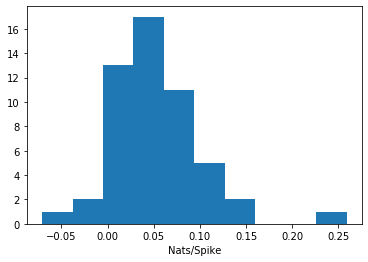

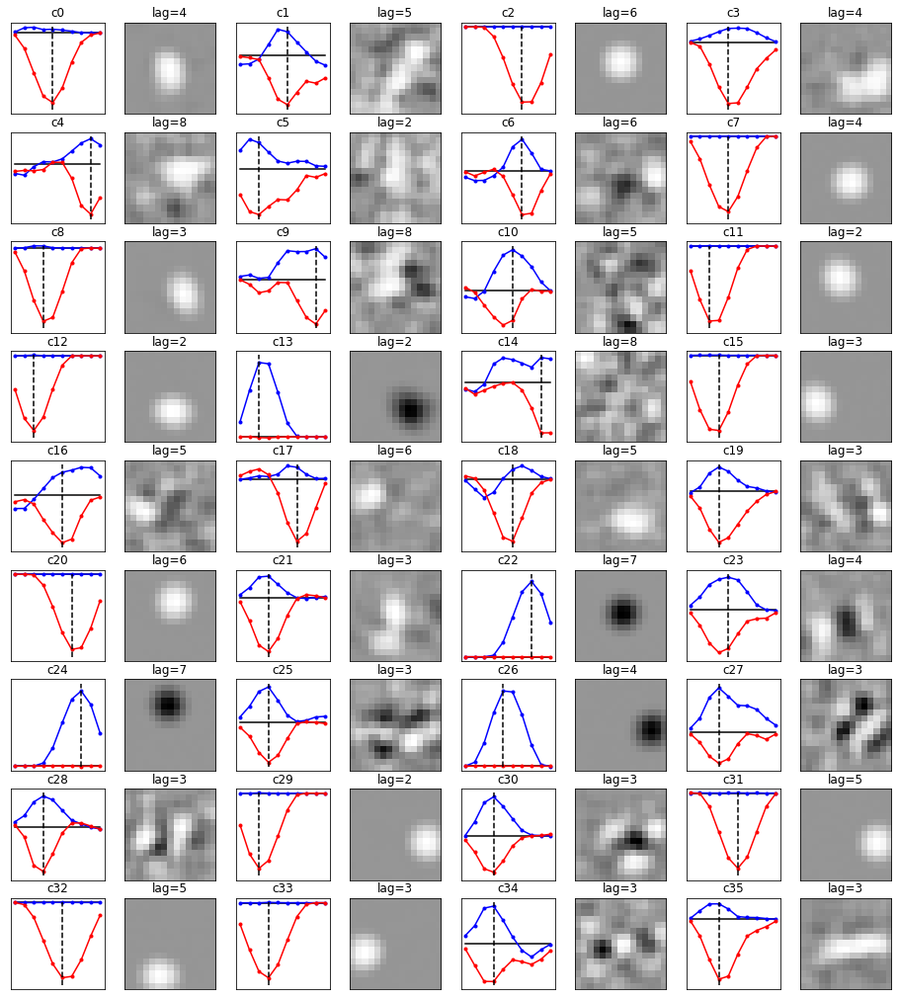

In [7]:
# get stimulus model
side2b, Xstim, Rvalid, rinds, cids, Cxinds = ne.get_stim_model(Stim, Robs, [NX,NY], valid=valdata, num_lags=10, plot=True, Cindx=Cxinds)
DU.plot_3dfilters(side2b)

72377 valid samples of 123751 possible


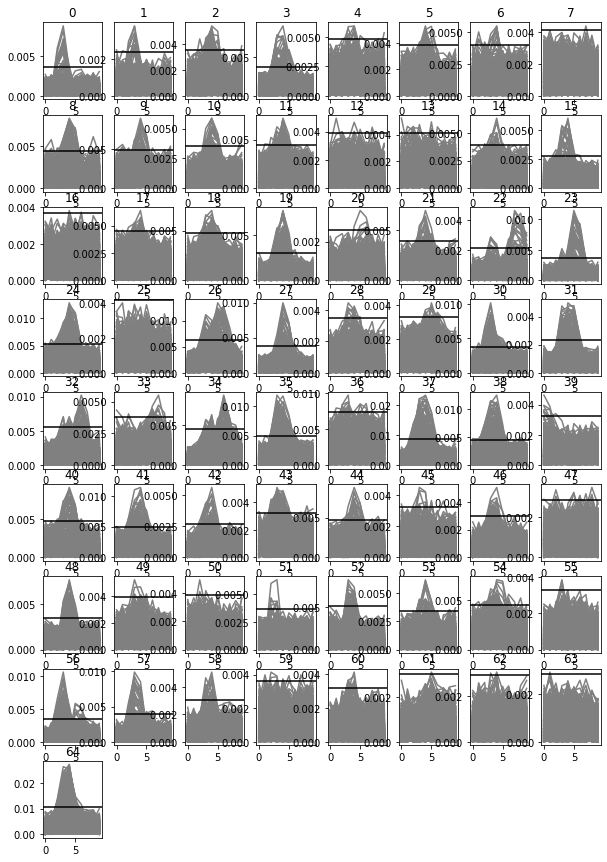

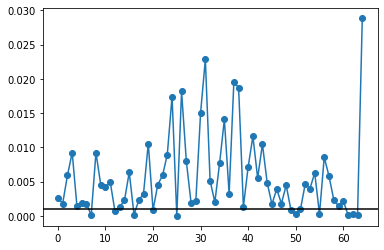

72377 valid samples of 123751 possible
53 good units


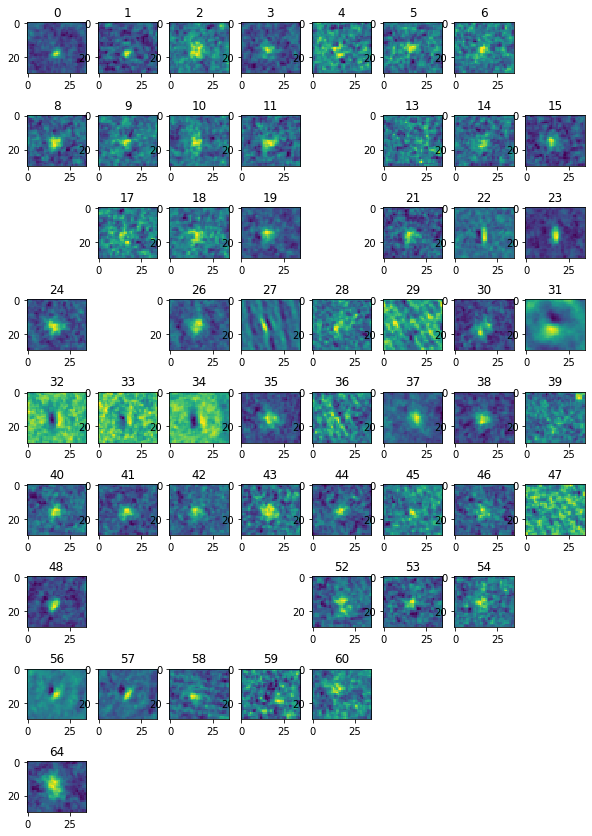

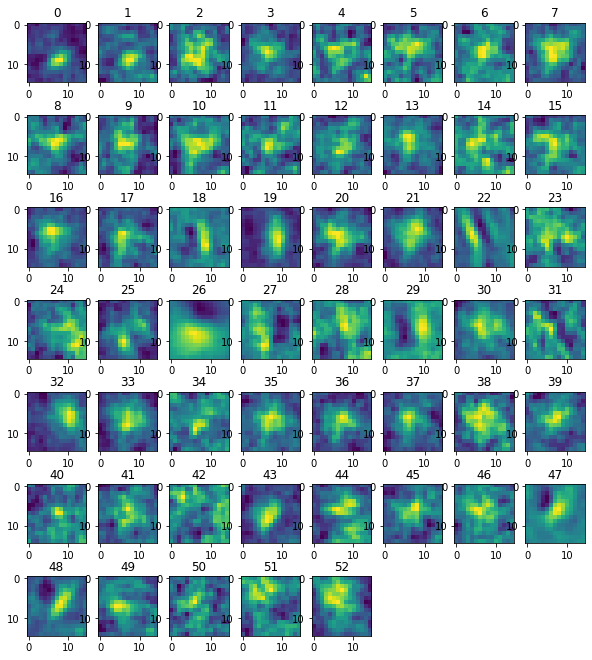

Epoch 0000:  avg train cost =     3.7665,  avg test cost =     3.9391,  reg penalty =     0.0909
Epoch 0029:  avg train cost =     3.7409,  avg test cost =     3.9369,  reg penalty =     0.0950
Epoch 0059:  avg train cost =     3.7371,  avg test cost =     3.9402,  reg penalty =     0.0957
Epoch 0089:  avg train cost =     3.7340,  avg test cost =     3.9411,  reg penalty =     0.0962

*** early stop criteria met...stopping train now...
     ---> number of epochs used: 101,  end cost: 214.003240
     ---> best epoch: 7,  best cost: 213.486070

0.11167351882517104


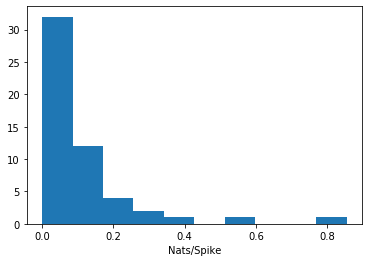

In [54]:
side2c, Xstim, Rvalid, rinds, cids, Cxinds = ne.get_stim_model(Stim, Robs, [NX,NY], valid=valdata, num_lags=10, plot=True,
            XTreg=0.01,L1reg=5e-3,MIreg=0.1,MSCreg=5.0,Greg=0.1,Mreg=1e-4,Cindx=Cxinds, base_mod=side2b, cids=cids)

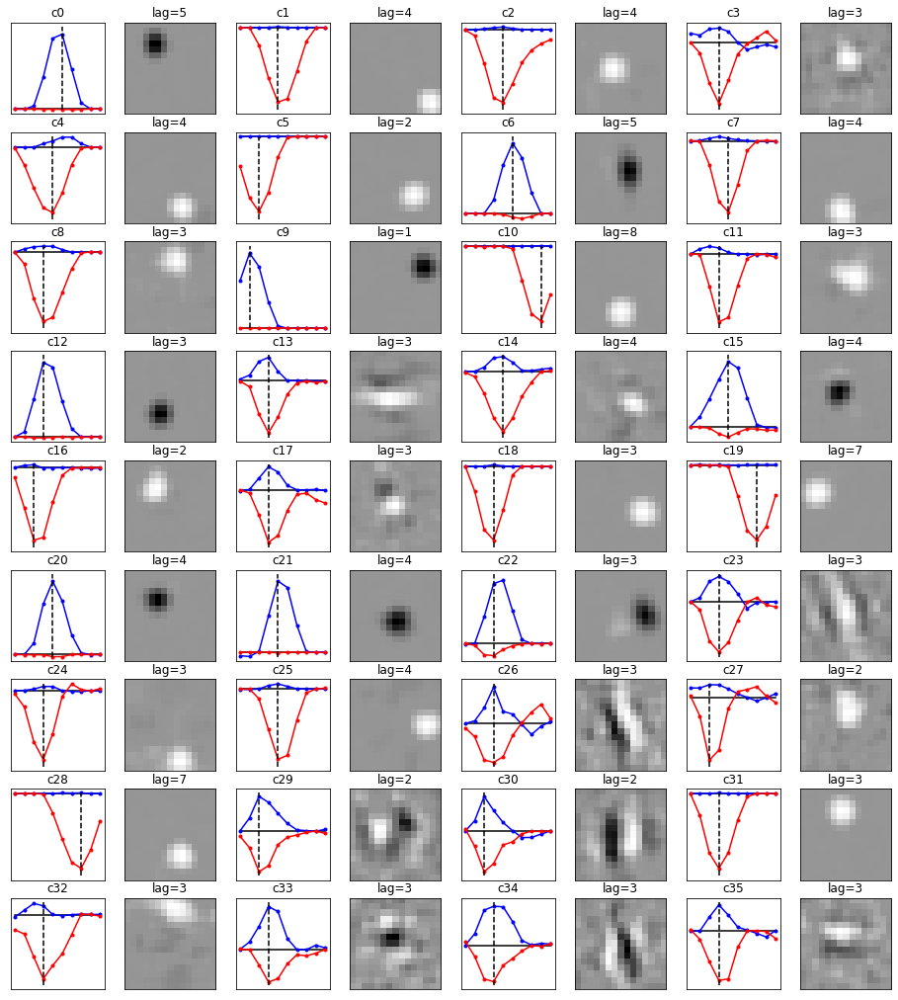

In [55]:
DU.plot_3dfilters(side2c)

In [56]:
side2b = side2c.copy_model()

  0%|          | 0/25 [00:00<?, ?it/s]

[-1.95024784e+02 -1.78772719e+02 -1.62520653e+02 -1.46268588e+02
 -1.30016523e+02 -1.13764457e+02 -9.75123920e+01 -8.12603267e+01
 -6.50082614e+01 -4.87561960e+01 -3.25041307e+01 -1.62520653e+01
 -2.84217094e-14  1.62520653e+01  3.25041307e+01  4.87561960e+01
  6.50082614e+01  8.12603267e+01  9.75123920e+01  1.13764457e+02
  1.30016523e+02  1.46268588e+02  1.62520653e+02  1.78772719e+02
  1.95024784e+02]


100%|██████████| 25/25 [22:00<00:00, 52.81s/it]


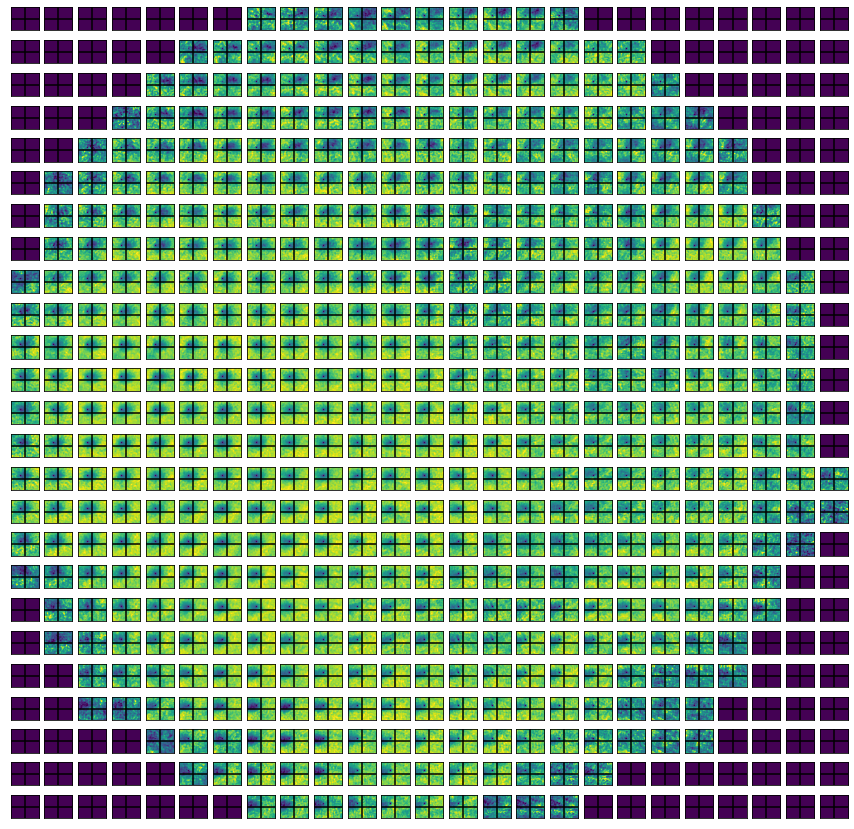

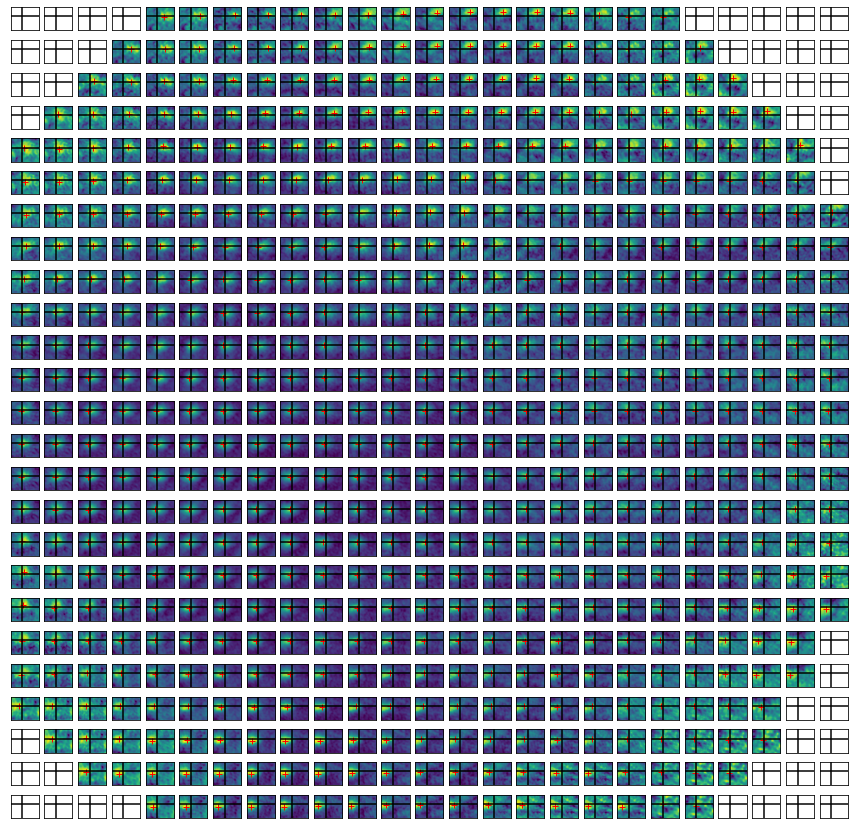

In [8]:
# Run it all once
eyeAtFrameCentered = (eyeAtFrame-(640, 380))

centers5, locs, LLspace1 = ne.get_corr_grid(side2b, Stim, Robs, [NX,NY], cids,
        eyeAtFrameCentered, valdata, valid_eye_rad=5.2*ppd, Erad=0.75*ppd, Npos=25,
        crop_edge=3, plot=True, interpolation_steps=2, softmax=1000)

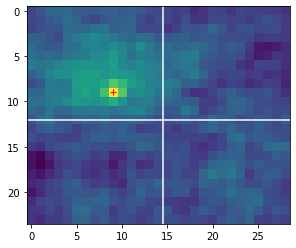

In [9]:
plt.figure()
ctrid = np.argmin(locs**2)
I = LLspace1[16,12,:,:]
I = 1-ne.normalize_range(I) # flip sign and normalize between 0 and 1
Lx,Ly = I.shape

x,y = ne.radialcenter(I**100)
plt.imshow(I, aspect='equal')
plt.axvline(Ly/2, color='w')
plt.axhline(Lx/2, color='w')
plt.plot(x,y, '+r')

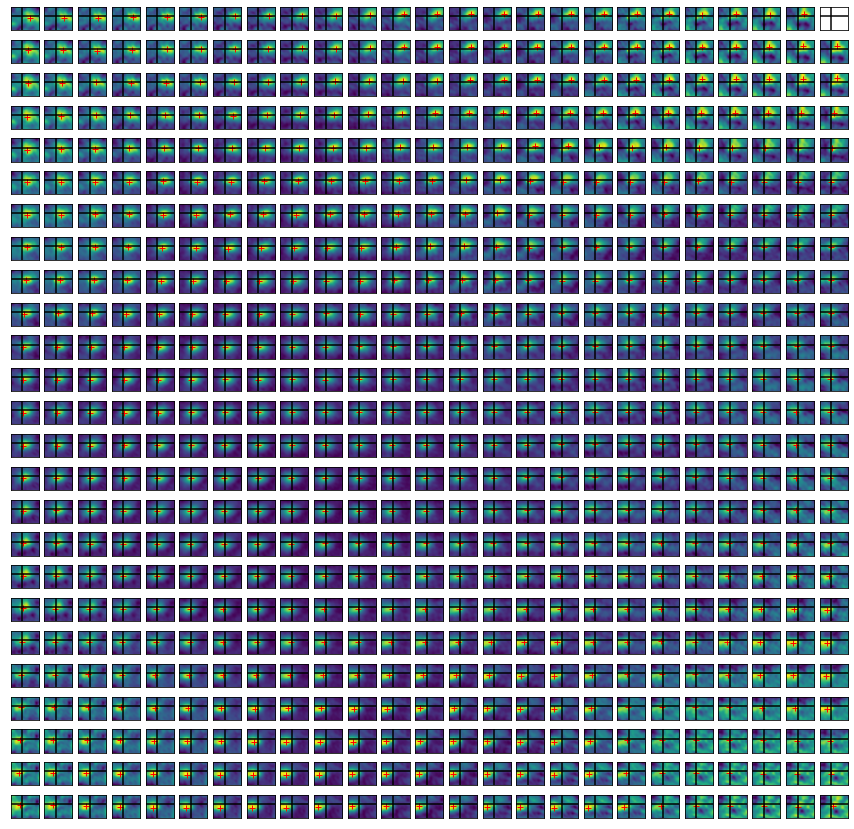

In [14]:
centers5,LLspace3 = ne.get_centers_from_LLspace(LLspace1, softmax=1, plot=True, interpolation_steps=6, crop_edge=3)

100%|██████████| 141698/141698 [00:12<00:00, 11359.98it/s]


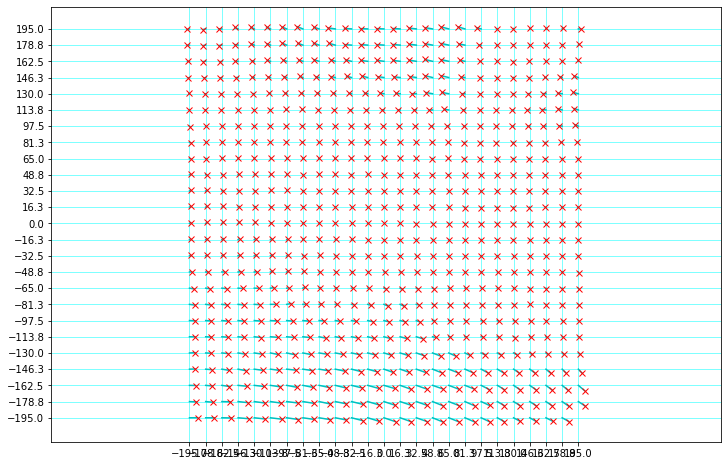

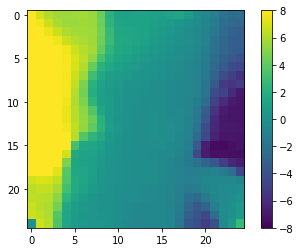

In [15]:
centers6 = deepcopy(centers5)
ctrid = np.argmin(locs**2)
centers6[:,:,0]-=centers6[ctrid,ctrid,0]
centers6[:,:,1]-=centers6[ctrid,ctrid,1]

xcorrec,ycorrec = ne.get_shifter_from_centers(centers6, locs, maxshift=8)


xshift = xcorrec(eyeAtFrameCentered[:,0], eyeAtFrameCentered[:,1])
yshift = ycorrec(eyeAtFrameCentered[:,0], eyeAtFrameCentered[:,1])

ix = np.logical_or(np.isnan(xshift), np.isnan(yshift))

xshift[ix] = 0.0
yshift[ix] = 0.0

StimC = ne.shift_stim(Stim, xshift, yshift, [NX,NY])

62723 valid samples of 141698 possible


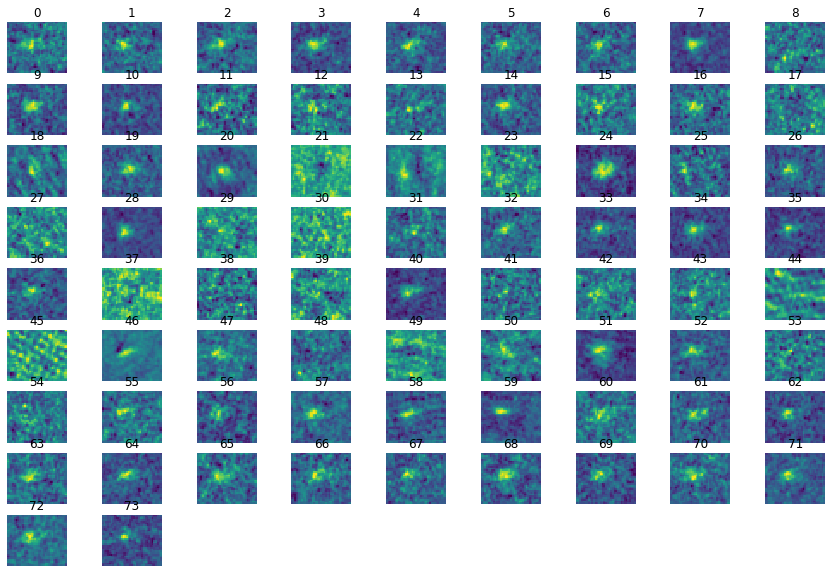

In [12]:
from copy import deepcopy
# shift eye at frame to shifted values
newEyeAtFrame = deepcopy(eyeAtFrameCentered)
newEyeAtFrame[:,0] += xshift
newEyeAtFrame[:,1] += xshift

valid = np.intersect1d(np.where(~ix)[0], valdata)
# check new STAS
stas = ne.get_stas(StimC, Robs, [NX,NY], valid=valid, num_lags=14, plot=False)

plt.figure(figsize=(15,10))
NC = Robs.shape[1]
sx,sy = U.get_subplot_dims(NC)
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], (NY,NX)))
    plt.title(cc)
    plt.axis("off")

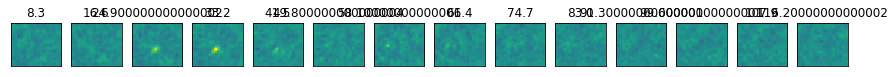

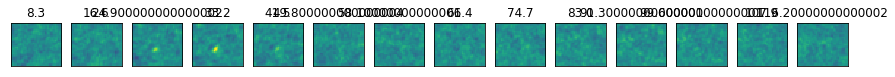

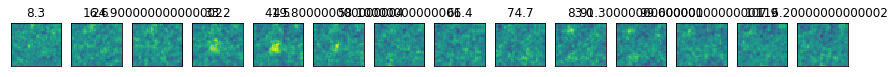

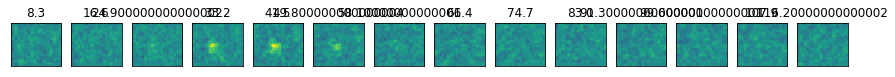

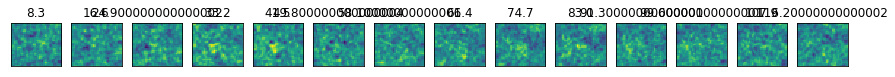

...

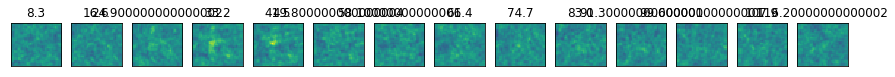

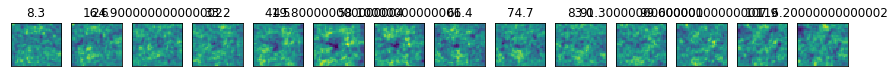

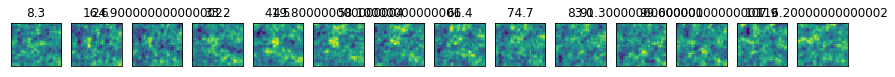

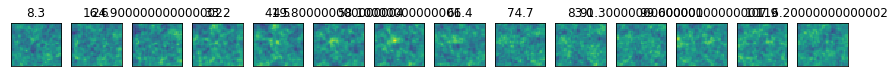

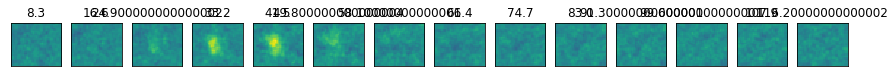

In [17]:
num_lags = stas.shape[1]
# plot individual units

for cc in range(NC):
    plt.figure(figsize=(15,2))
    for ilag in range(num_lags):
        ax = plt.subplot(1,num_lags, ilag+1)
        sta = stas[:,:,cc]
#         sta = (sta - np.min(sta)) / (np.max(sta) - np.min(sta))
        sta -= np.mean(sta)
        sta /= np.max(sta)
        I = np.reshape(sta[:,ilag], (NY,NX))
        plt.imshow(I, vmin=-1, vmax=1)#, cmap='coolwarm')
        ax.set_xticks([])
        ax.set_yticks([])
        plt.title(8.3*(ilag+1))

In [100]:
# if happy with output, run the correction on all eye positions
eye,ft = ne.load_eye_at_frame(dirname=dirname, flist=flist, corrected=True)

eyeCentered = (eye - (640, 380))
# eyeCentered = eye

xshift = xcorrec(eyeCentered[:,0], eyeCentered[:,1])
yshift = ycorrec(eyeCentered[:,0], eyeCentered[:,1])

ix = np.logical_or(np.isnan(xshift), np.isnan(yshift))

xshift[ix] = 0.0
yshift[ix] = 0.0

eyeCentered[:,0] += xshift
eyeCentered[:,1] += yshift


eyeShift = np.asarray((xshift, yshift)).T

import scipy.io as sio

subjstr = flist[0].split('_')
outname = subjstr[0] + '_' + subjstr[1] + '_eyetraces.mat'

sio.savemat(dirname + outname, {'frameTime': ft, 'eyeAtFrame': eyeCentered, 'eyeShift': eyeShift})

In [18]:
# correct stim and save C.mat
import scipy.io as sio

for file in flist:
    
    print("Shifting stimulus for [%s]" %file)
    # load
    matdat = ne.loadmat(dirname + file)
    
    # get relevant data
    eye = matdat['eyeAtFrame'].T
    ft = matdat['frameTimes'].T

    Stim = matdat['stim'].T

    NX = matdat['NX'][0][0].astype(int)
    NY = Stim.shape[1]//NX

    # correct stimulus
    eyeCentered = (eye - (640, 380))

    xshift = xcorrec(eyeCentered[:,0], eyeCentered[:,1])
    yshift = ycorrec(eyeCentered[:,0], eyeCentered[:,1])
    
    eye[:,0]+=xshift
    eye[:,1]+=yshift
    
    StimC = ne.shift_stim(Stim, xshift, yshift, [NX,NY])
    
    sio.savemat(dirname + file[:-4] + 'C.mat', {'eyeAtFrame': eye.T, 'frameTimes': ft.T, 'stim': StimC.T, 'NX':NX})


Shifting stimulus for [logan_20200304_Gabor_-20_-10_40_60_2_2_0_9_0.mat]


100%|██████████| 76703/76703 [00:07<00:00, 10777.25it/s]


Shifting stimulus for [logan_20200304_Grating_-20_-10_40_60_2_2_0_9_0.mat]


100%|██████████| 46948/46948 [00:04<00:00, 11160.30it/s]


Shifting stimulus for [logan_20200304_FixRsvpStim_-20_-10_40_60_2_2_0_9_0.mat]


100%|██████████| 9351/9351 [00:00<00:00, 10096.63it/s]


Shifting stimulus for [logan_20200304_BackImage_-20_-10_40_60_2_2_0_9_0.mat]


100%|██████████| 94585/94585 [00:08<00:00, 10654.72it/s]


72291 valid samples of 123751 possible


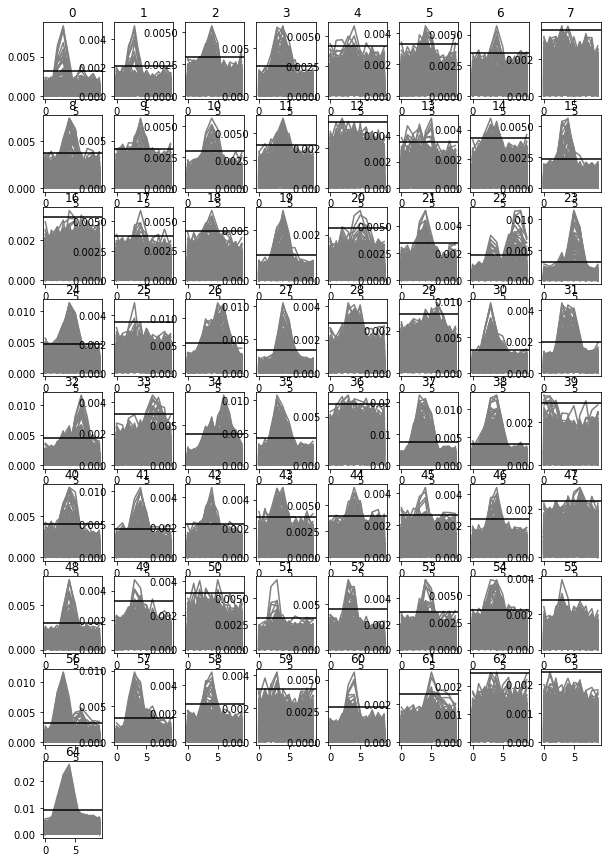

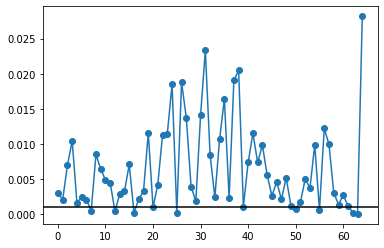

72291 valid samples of 123751 possible
56 good units


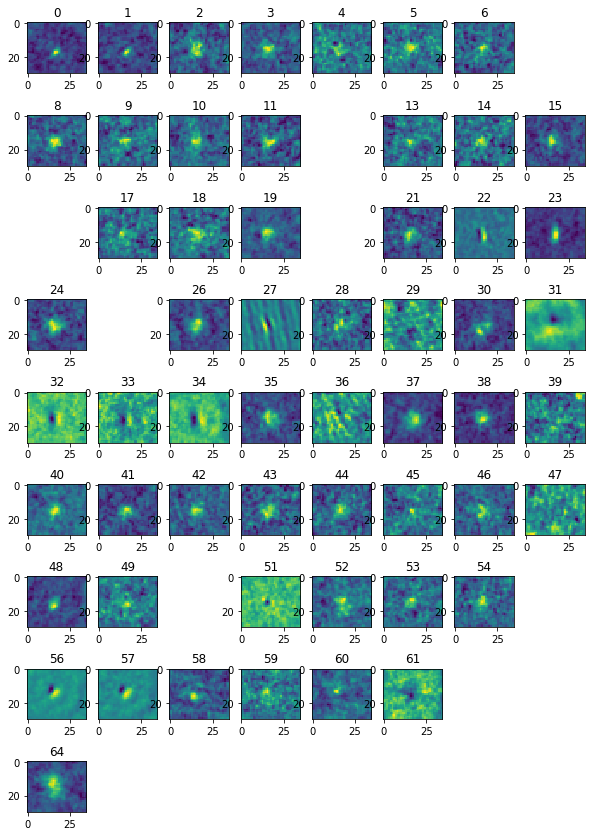

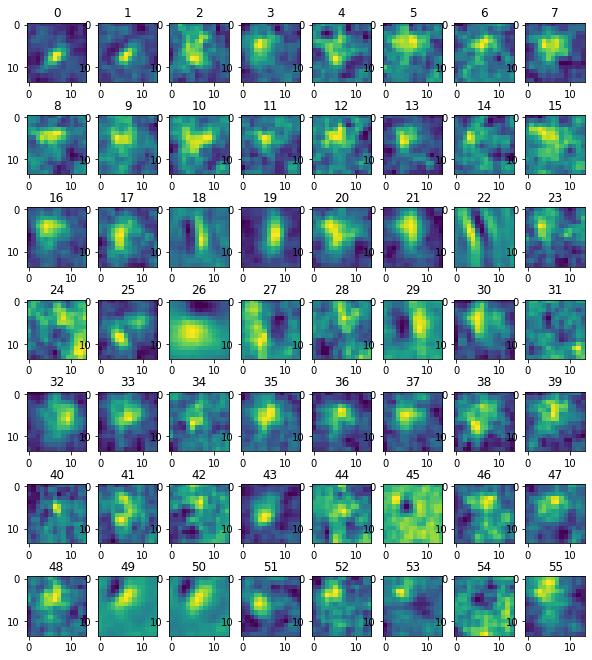

Input dimensions: [1, 14, 14, 10]
0: normal (relu):  	[E18/I18] N
1: normal (relu):  	[E12/I12] N+
0: normal (softplus):  	[E56/I0] N
Epoch 0000:  avg train cost =     6.1718,  avg test cost =     6.3418,  reg penalty =     0.1224
Epoch 0029:  avg train cost =     3.7122,  avg test cost =     4.0916,  reg penalty =     0.0789
Epoch 0059:  avg train cost =     3.6484,  avg test cost =     4.0651,  reg penalty =     0.0755
Epoch 0089:  avg train cost =     3.6220,  avg test cost =     4.0625,  reg penalty =     0.0746
Epoch 0119:  avg train cost =     3.6088,  avg test cost =     4.0648,  reg penalty =     0.0746
Epoch 0149:  avg train cost =     3.5999,  avg test cost =     4.0675,  reg penalty =     0.0747

*** early stop criteria met...stopping train now...
     ---> number of epochs used: 163,  end cost: 231.856388
     ---> best epoch: 128,  best cost: 231.339538

Epoch 0000:  avg train cost =     3.6601,  avg test cost =     4.0497,  reg penalty =     1.6805
Epoch 0029:  avg train 

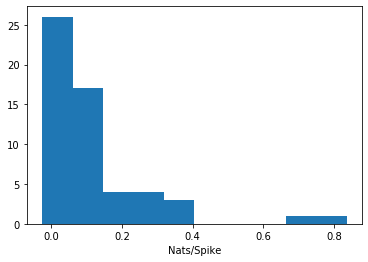

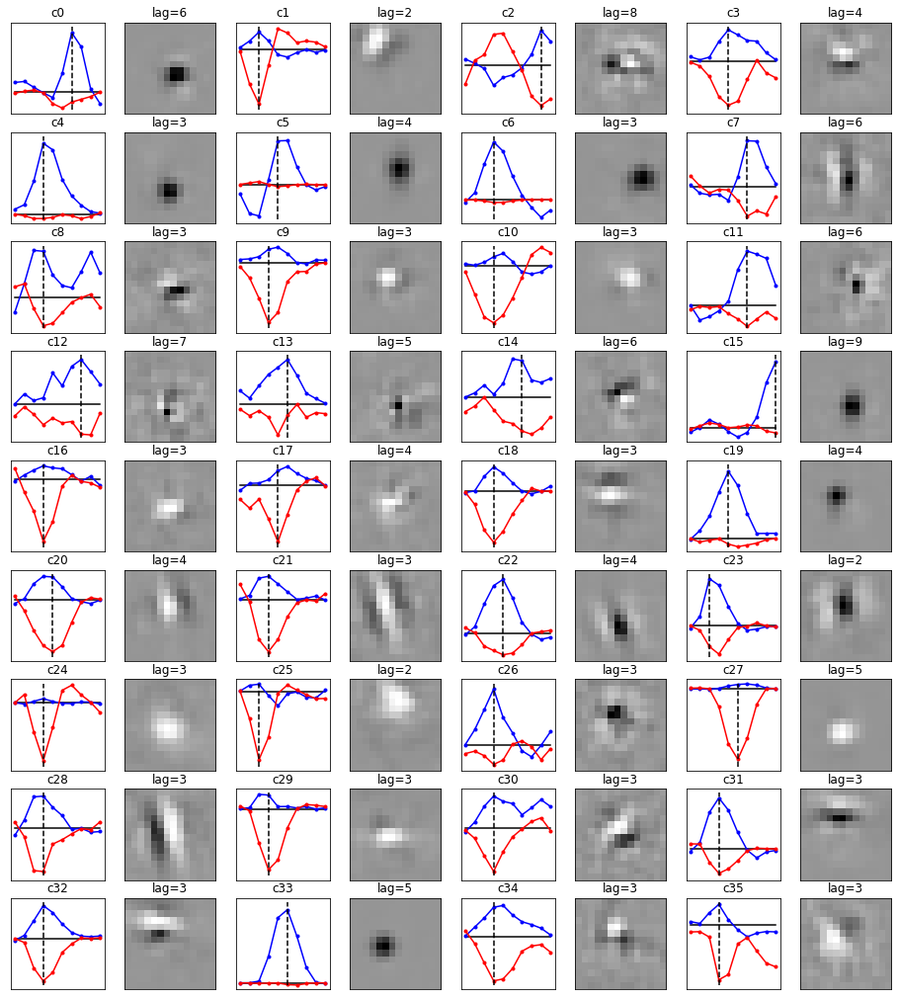

In [22]:
# otherwise, fit new stimulus model and try again
# side2c, Xstim, Rvalid, rinds, cids, Cxinds = ne.get_stim_model(StimC, Robs, [NX,NY], valid=valdata, num_lags=10, plot=True,
#         XTreg=0.005,L1reg=1e-3,MIreg=0.1,MSCreg=5.0,Greg=0.5,Mreg=1e-4,Cindx=Cxinds)

side2c, Xstim, Rvalid, rinds, cids, Cxinds = ne.get_stim_model(StimC, Robs, [NX,NY], valid=valdata, num_lags=10, plot=True,
        XTreg=0.005,L1reg=1e-3,MIreg=0.1,MSCreg=5.0,Greg=0.5,Mreg=1e-4,Cindx=Cxinds)

DU.plot_3dfilters(side2c)

In [23]:
# if model is good, re-run starting from "Run it all once cell"

side2b = side2c.copy_model()

In [16]:
xshift[ix] = 0.0
yshift[ix] = 0.0

# plt.plot(xshift[range(1000)])

StimC = shift_stim(Stim, xshift, yshift, [NX,NY])

# shift eye at frame to shifted values
newEyeAtFrame[:,0] += xshift
newEyeAtFrame[:,1] += xshift

100%|██████████| 123751/123751 [00:11<00:00, 11227.97it/s]


72291 valid samples of 123751 possible


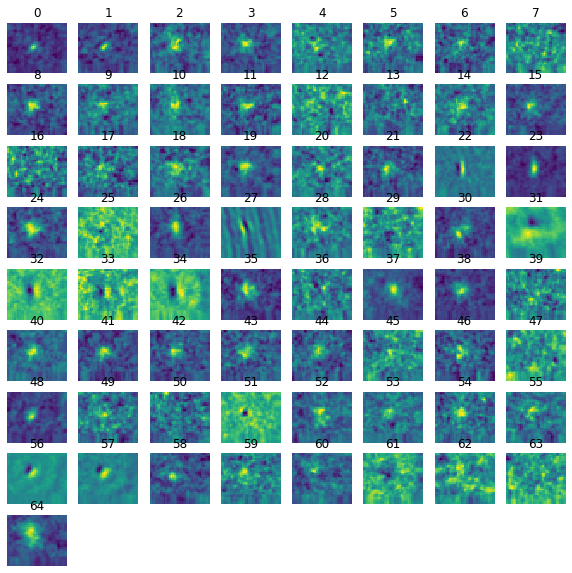

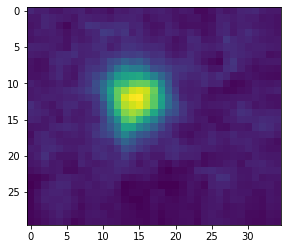

In [19]:
# check new STAS
stas = get_stas(StimC, Robs, [NX,NY], valid=valdata, num_lags=10, plot=False)

plt.figure(figsize=(10,10))
NC = Robs.shape[1]
sx,sy = U.get_subplot_dims(NC)
sumdensity = 0
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], (NY,NX)))
    sumdensity += np.abs(stas[:,bestlag,cc])
    plt.title(cc)
    plt.axis("off")
    
plt.figure()
plt.imshow(np.reshape(sumdensity, (NY, NX)))
    

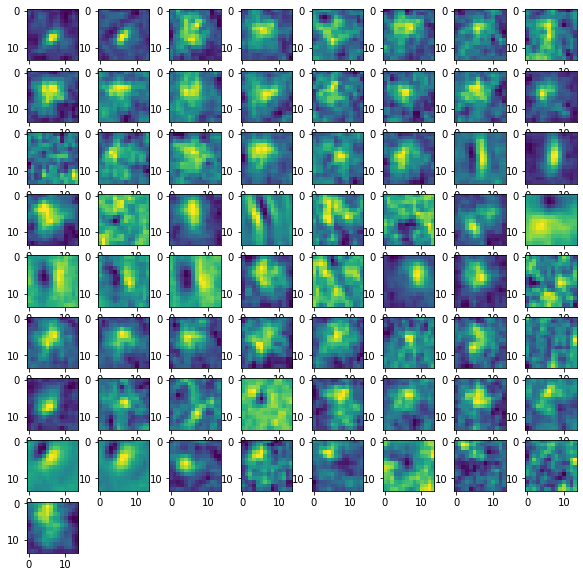

In [44]:
Cxinds = crop_indx(NX, range(10,24), range(10,24))
NX2 = np.sqrt(len(Cxinds)).astype(int)
plt.figure(figsize=(10,10))
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    sta = stas[:,bestlag,cc]
    plt.imshow(np.reshape(sta[Cxinds], [NX2,NX2]))


72291 valid samples of 123751 possible


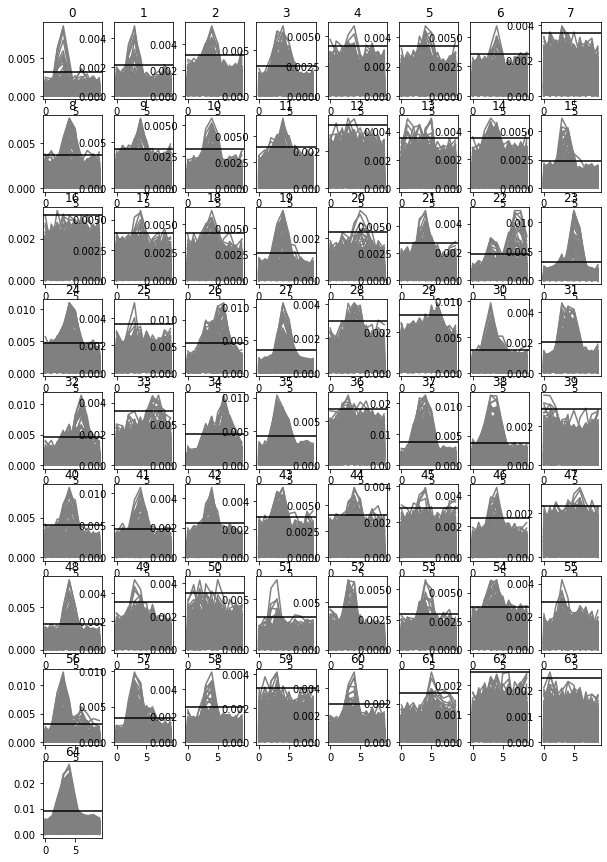

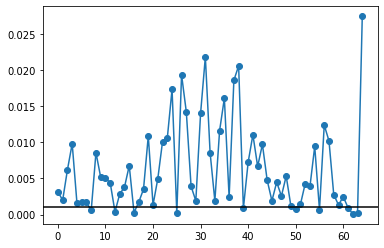

72291 valid samples of 123751 possible
55 good units


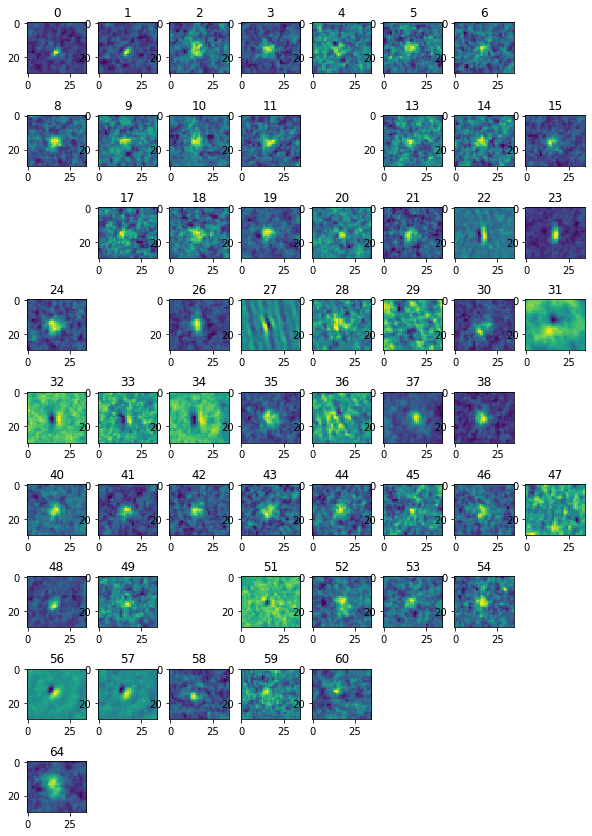

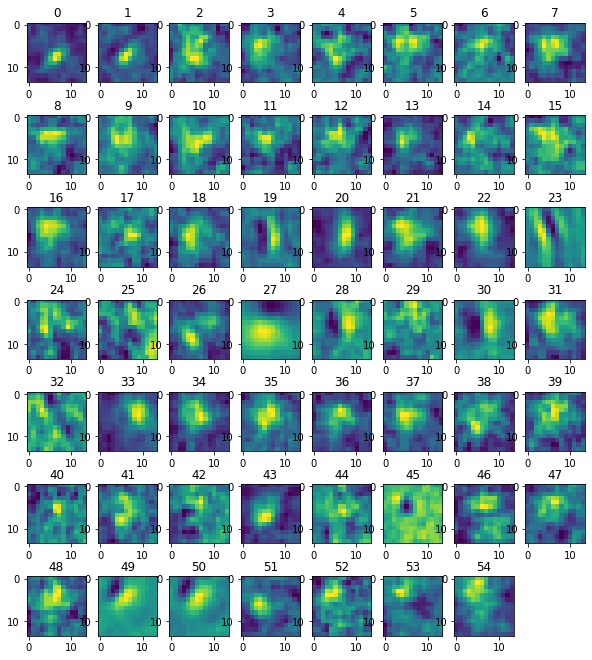

Input dimensions: [1, 14, 14, 10]
0: normal (relu):  	[E18/I18] N
1: normal (relu):  	[E12/I12] N+
0: normal (softplus):  	[E55/I0] N
Epoch 0000:  avg train cost =     5.9335,  avg test cost =     6.1087,  reg penalty =     0.1239
Epoch 0029:  avg train cost =     3.6890,  avg test cost =     4.0663,  reg penalty =     0.0782
Epoch 0059:  avg train cost =     3.6269,  avg test cost =     4.0468,  reg penalty =     0.0766
Epoch 0089:  avg train cost =     3.6053,  avg test cost =     4.0492,  reg penalty =     0.0763
Epoch 0119:  avg train cost =     3.5949,  avg test cost =     4.0516,  reg penalty =     0.0761

*** early stop criteria met...stopping train now...
     ---> number of epochs used: 142,  end cost: 227.067899
     ---> best epoch: 131,  best cost: 226.638391

Epoch 0000:  avg train cost =     3.6560,  avg test cost =     4.0392,  reg penalty =     1.7192
Epoch 0029:  avg train cost =     3.7448,  avg test cost =     3.9426,  reg penalty =     0.1391
Epoch 0059:  avg train 

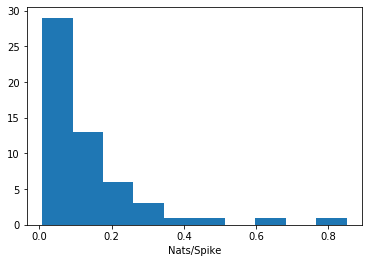

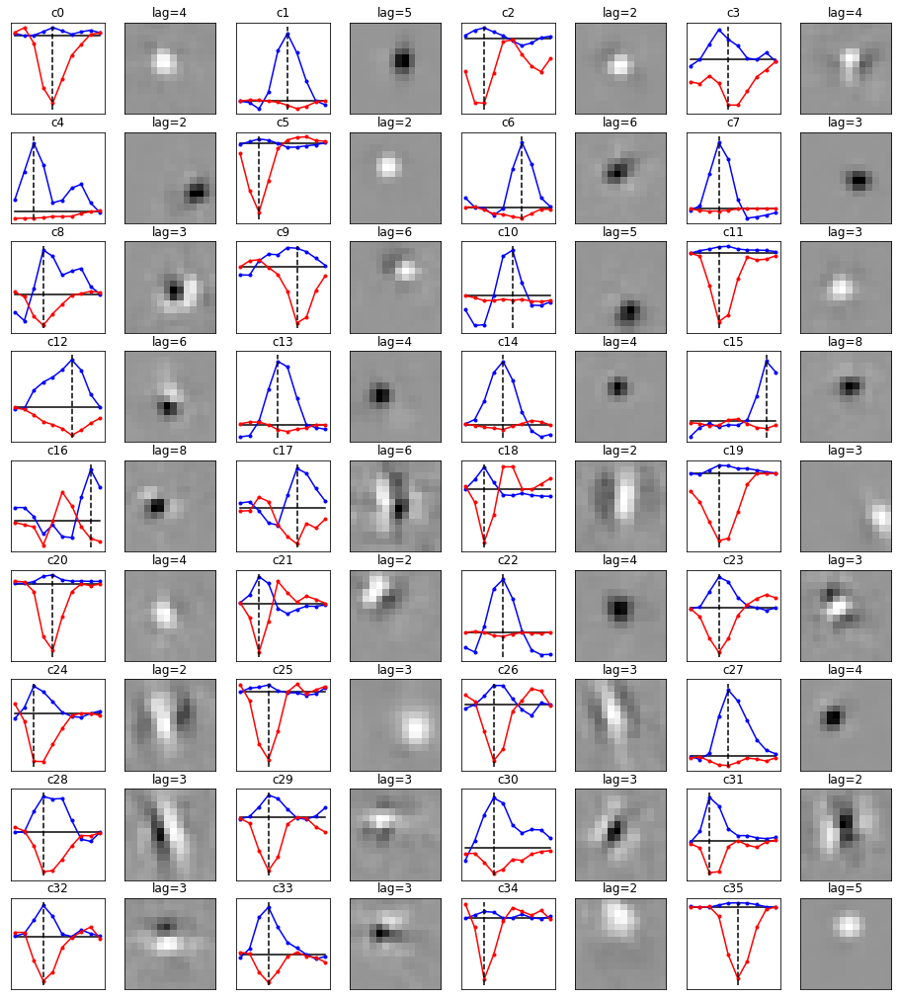

In [45]:
# get new stimulus model
# get new stimulus model
side2c, Xstim, Rvalid, rinds, cids, Cxinds = get_stim_model(StimC, Robs, [NX,NY], valid=valdata, num_lags=10, plot=True,
        XTreg=0.005,L1reg=1e-3,MIreg=0.1,MSCreg=5.0,Greg=0.5,Mreg=1e-4,Cindx=Cxinds)

DU.plot_3dfilters(side2c)

In [ ]:
# run it all again
newEyeAtFrame = (eyeAtFrame-(640, 380))

centers5, locs, LLspace1 = get_corr_grid(side2c, Stim, Robs, [NX,NY], cids,
        newEyeAtFrame, valdata, valid_eye_rad=5.2*ppd, Erad=0.75*ppd, Npos=25,
        crop_edge=3, plot=False, interpolation_steps=2, softmax=10)

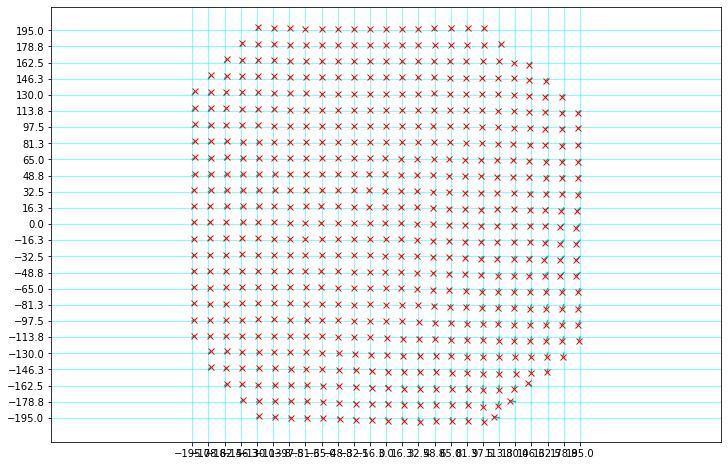

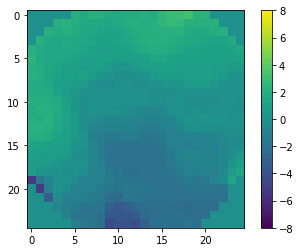

In [33]:
centers6 = deepcopy(centers5)
centers6[:,:,0] -= np.nanmean(centers6[:,:,0])
centers6[:,:,1] -= np.nanmean(centers6[:,:,1])

xcorrec,ycorrec = get_shifter_from_centers(centers6, locs)

# plt.imshow(centers6[:,:,0]-centers5[:,:,0])
# plt.colorbar()



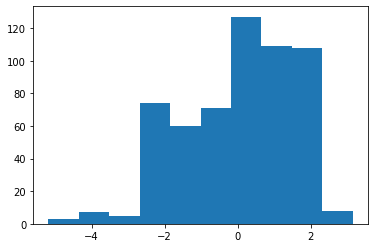

In [34]:
newEyeAtFrame = (eyeAtFrame-(640, 380))

xshift = xcorrec(newEyeAtFrame[:,0], newEyeAtFrame[:,1])
yshift = ycorrec(newEyeAtFrame[:,0], newEyeAtFrame[:,1])

ix = np.logical_or(np.isnan(xshift), np.isnan(yshift))

# xshift[ix] = 0.0
# yshift[ix] = 0.0

# plt.plot(xshift[range(1000)])

StimC = shift_stim(Stim, xshift, yshift, [NX,NY])

# shift eye at frame to shifted values
newEyeAtFrame[:,0] += xshift
newEyeAtFrame[:,1] += xshift


100%|██████████| 123751/123751 [00:11<00:00, 11024.51it/s]


(array([21546.,  4742.,  9526.,  8087.,  8021., 20909., 35961., 12299.,
         2147.,   513.]),
 array([0.        , 0.67125225, 1.3425045 , 2.01375675, 2.685009  ,
        3.35626126, 4.02751351, 4.69876576, 5.37001801, 6.04127026,
        6.71252251]),
 <a list of 10 Patch objects>)

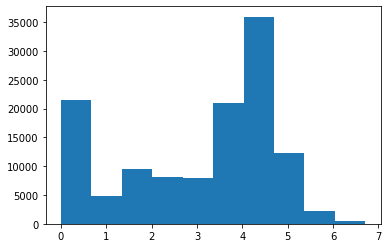

In [24]:
f = plt.hist(np.hypot(xshift, yshift))

72291 valid samples of 123751 possible


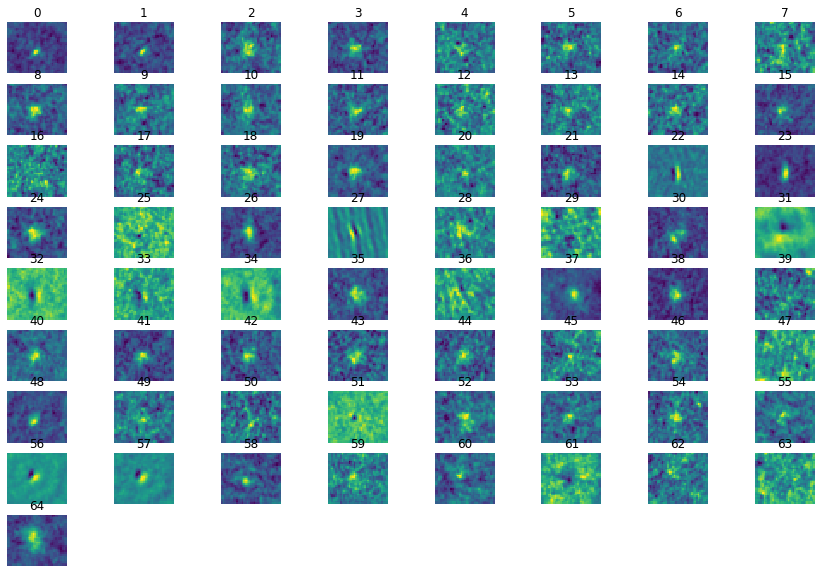

In [35]:
valid = np.intersect1d(np.where(~ix)[0], valdata)
# check new STAS
stas = get_stas(StimC, Robs, [NX,NY], valid=valid, num_lags=10, plot=False)

plt.figure(figsize=(15,10))
NC = Robs.shape[1]
sx,sy = U.get_subplot_dims(NC)
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], (NY,NX)))
    plt.title(cc)
    plt.axis("off")
    


  0%|          | 0/25 [00:00<?, ?it/s]

[-1.95024784e+02 -1.78772719e+02 -1.62520653e+02 -1.46268588e+02
 -1.30016523e+02 -1.13764457e+02 -9.75123920e+01 -8.12603267e+01
 -6.50082614e+01 -4.87561960e+01 -3.25041307e+01 -1.62520653e+01
 -2.84217094e-14  1.62520653e+01  3.25041307e+01  4.87561960e+01
  6.50082614e+01  8.12603267e+01  9.75123920e+01  1.13764457e+02
  1.30016523e+02  1.46268588e+02  1.62520653e+02  1.78772719e+02
  1.95024784e+02]



100%|██████████| 25/25 [22:03<00:00, 52.95s/it]

100%|██████████| 123751/123751 [00:10<00:00, 11266.62it/s]


72291 valid samples of 123751 possible


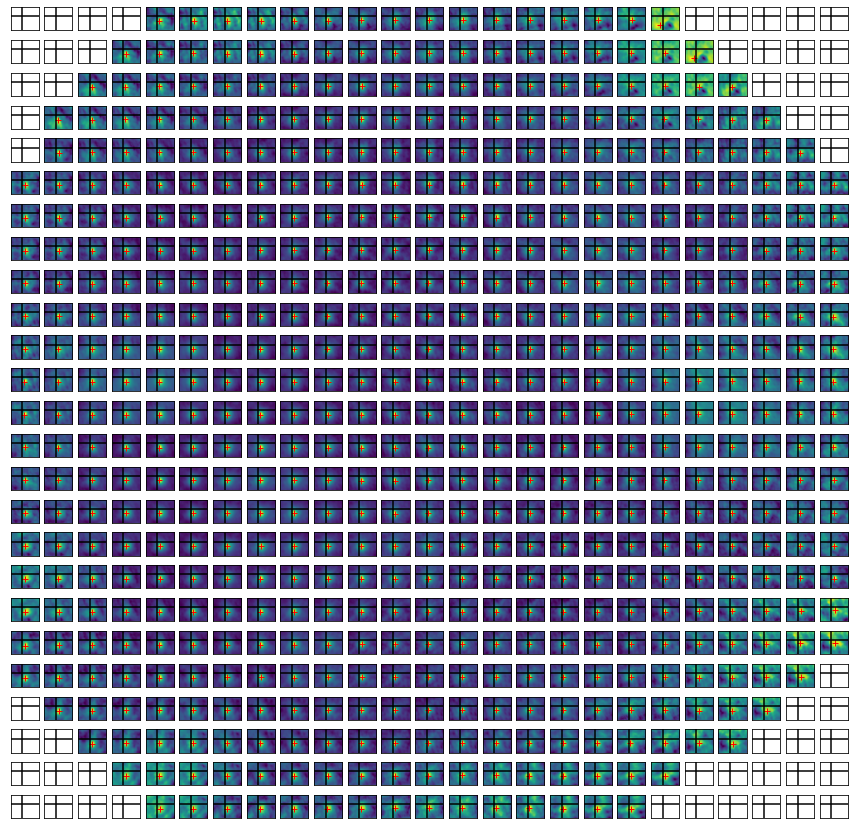

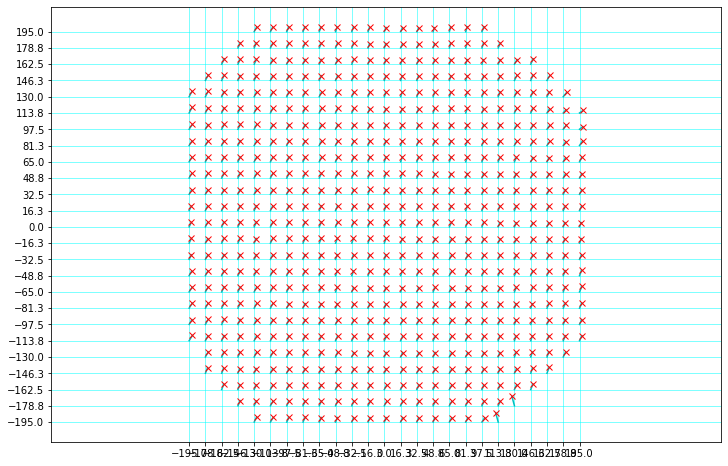

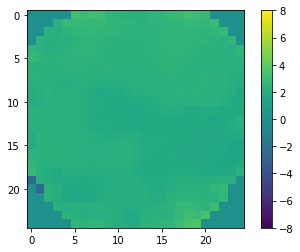

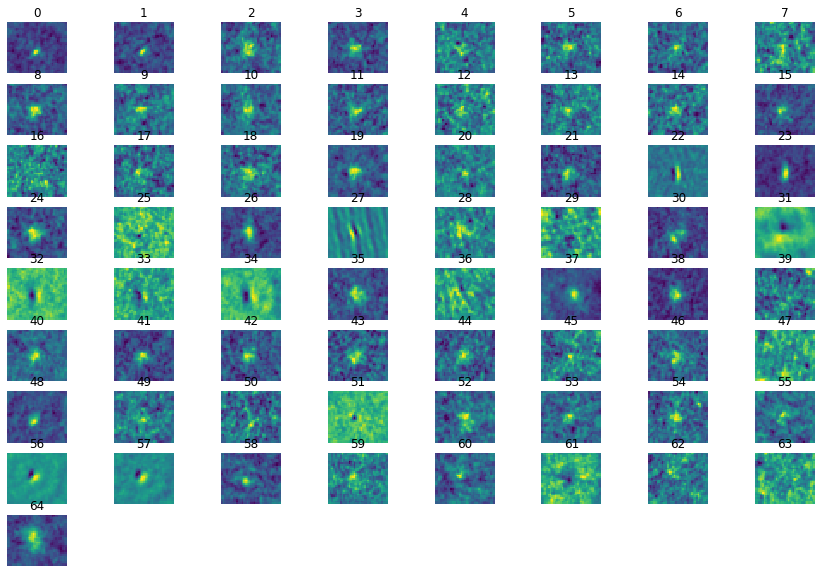

In [46]:
centers6, locs, LLspace1 = get_corr_grid(side2c, StimC, Robs, [NX,NY], cids,
        newEyeAtFrame, valdata, valid_eye_rad=5.2*ppd, Erad=0.75*ppd, Npos=25,
        crop_edge=3, plot=False, interpolation_steps=2, softmax=10)


xcorrec2,ycorrec2 = get_shifter_from_centers(centers6, locs)


xshift2 = xcorrec2(newEyeAtFrame[:,0], newEyeAtFrame[:,1])
yshift2 = ycorrec2(newEyeAtFrame[:,0], newEyeAtFrame[:,1])

ix = np.logical_or(np.isnan(xshift2), np.isnan(yshift2))


StimD = shift_stim(StimC, xshift2, yshift2, [NX,NY])

# shift eye at frame to shifted values
newEyeAtFrame2 = deepcopy(newEyeAtFrame)
newEyeAtFrame2[:,0] += xshift
newEyeAtFrame2[:,1] += xshift


valid = np.intersect1d(np.where(~ix)[0], valdata)

# check new STAS
stas = get_stas(StimC, Robs, [NX,NY], valid=valid, num_lags=10, plot=False)

plt.figure(figsize=(15,10))
NC = Robs.shape[1]
sx,sy = U.get_subplot_dims(NC)
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], (NY,NX)))
    plt.title(cc)
    plt.axis("off")
    

[3.38499892 2.2576746 ]


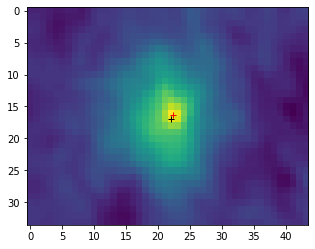

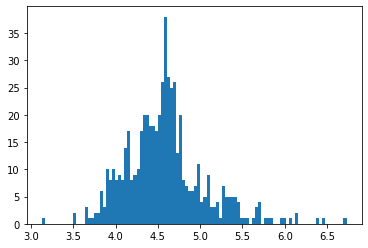

In [287]:
xx = 11
yy = 10

I = deepcopy(LLspace3[xx,yy,:,:])
I = 1-normalize_range(I) # flip sign and normalize between 0 and 1

min1,min2 = radialcenter(I**softmax) # softmax center

plt.imshow(I)
plt.plot(min1, min2, '+r')
plt.plot(cx, cy, '+k')

print(centers5[xx,yy,:])

plt.figure()
f = plt.hist(np.hypot(centers5[:,:,0].flatten(), centers5[:,:,1].flatten()), 100)

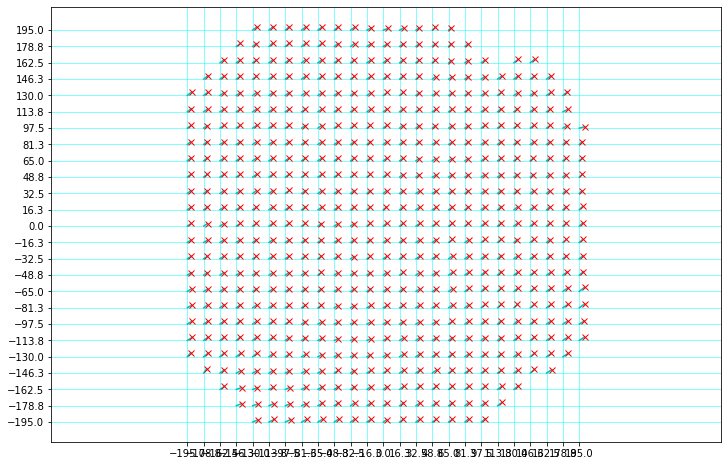

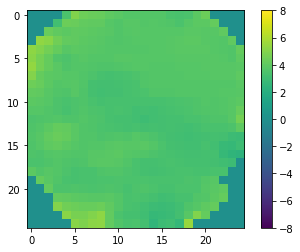

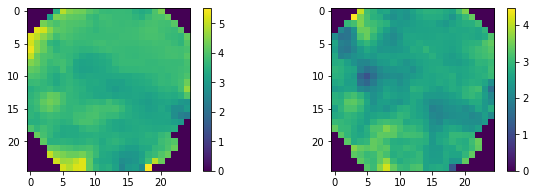

In [292]:
        
xcorrec,ycorrec = get_shifter_from_centers(centers5, locs)

plt.figure(figsize=(10,3))
plt.subplot(121)
plt.imshow(np.reshape(xcorrec(coords[:,0], coords[:,1]), (Npos,Npos)))
plt.colorbar()
plt.subplot(122)
plt.imshow(np.reshape(ycorrec(coords[:,0], coords[:,1]), (Npos,Npos)))
plt.colorbar()

100%|██████████| 123751/123751 [00:14<00:00, 8484.63it/s]


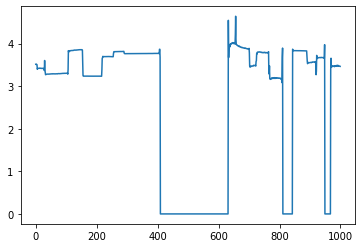

In [295]:
xshift = xcorrec(newEyeAtFrame[:,0], newEyeAtFrame[:,1])
yshift = ycorrec(newEyeAtFrame[:,0], newEyeAtFrame[:,1])

ix = np.logical_or(np.isnan(xshift), np.isnan(yshift))

xshift[ix] = 0.0
yshift[ix] = 0.0

plt.plot(xshift[range(1000)])

StimC = shift_stim(StimC, xshift, yshift, [NX,NY])



72291 valid samples of 123751 possible


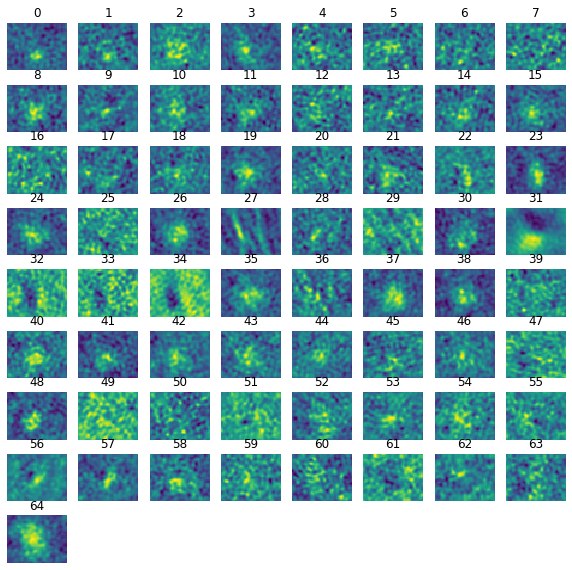

In [296]:
stas = get_stas(Stim, Robs, [NX,NY], valid=valdata, num_lags=10, plot=False)
stas.shape

plt.figure(figsize=(10,10))
NC = Robs.shape[1]
sx,sy = U.get_subplot_dims(NC)
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], (NY,NX)))
    plt.title(cc)
    plt.axis("off")
    

72291 valid samples of 123751 possible


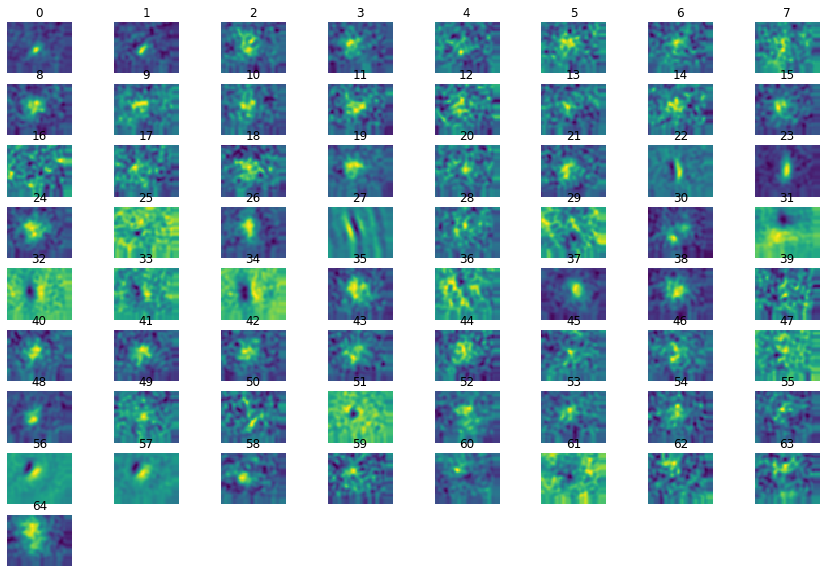

In [297]:
stas = get_stas(StimC, Robs, [NX,NY], valid=valdata, num_lags=10, plot=False)

plt.figure(figsize=(15,10))
NC = Robs.shape[1]
sx,sy = U.get_subplot_dims(NC)
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], (NY,NX)))
    plt.title(cc)
    plt.axis("off")

72291 valid samples of 123751 possible


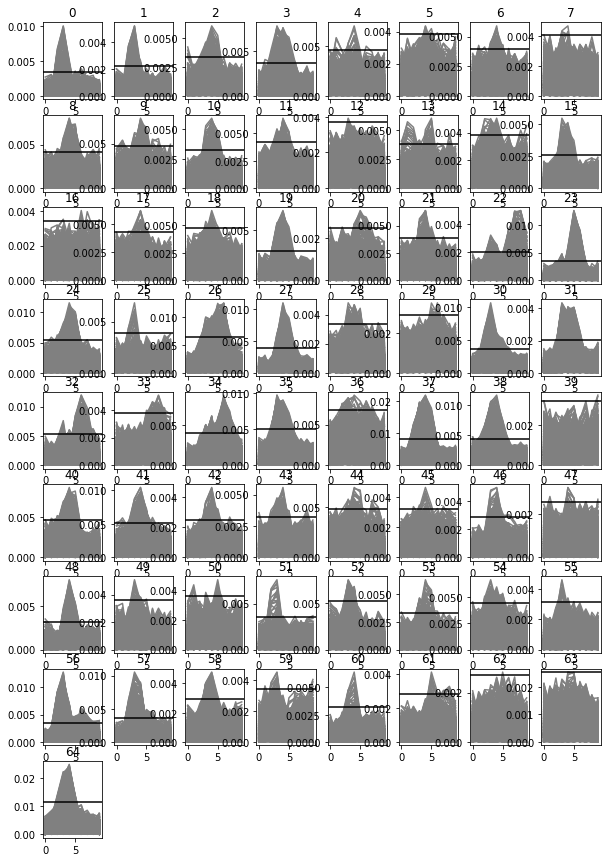

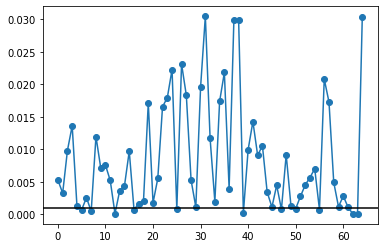

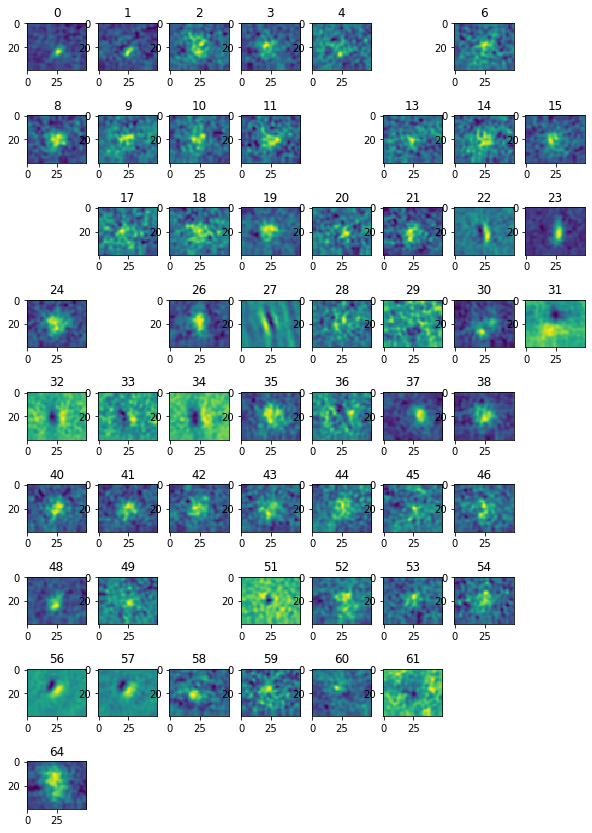

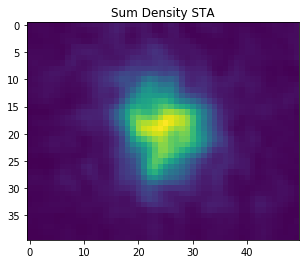

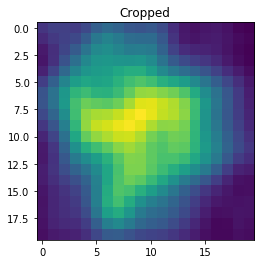

72291 valid samples of 123751 possible
54 good units


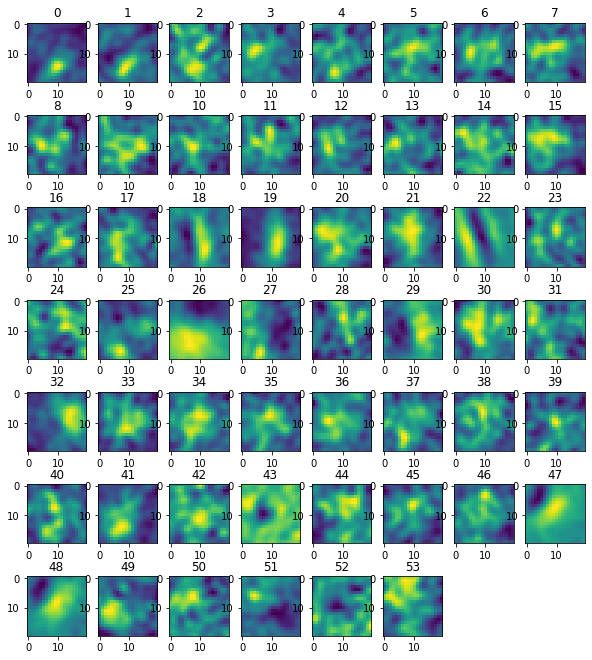

Input dimensions: [1, 20, 20, 10]
0: normal (relu):  	[E18/I18] N
1: normal (relu):  	[E12/I12] N+
0: normal (softplus):  	[E54/I0] N
Epoch 0000:  avg train cost =     5.3334,  avg test cost =     5.5200,  reg penalty =     0.2953
Epoch 0029:  avg train cost =     3.7016,  avg test cost =     4.1210,  reg penalty =     0.1026
Epoch 0059:  avg train cost =     3.6418,  avg test cost =     4.0774,  reg penalty =     0.0957
Epoch 0089:  avg train cost =     3.6198,  avg test cost =     4.0781,  reg penalty =     0.0934
Epoch 0119:  avg train cost =     3.6095,  avg test cost =     4.0840,  reg penalty =     0.0925
Epoch 0149:  avg train cost =     3.6027,  avg test cost =     4.0894,  reg penalty =     0.0923

*** early stop criteria met...stopping train now...
     ---> number of epochs used: 153,  end cost: 225.853635
     ---> best epoch: 83,  best cost: 224.964114

Epoch 0000:  avg train cost =     3.6763,  avg test cost =     4.0716,  reg penalty =     1.6150
Epoch 0029:  avg train c

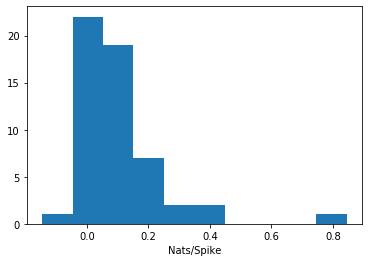

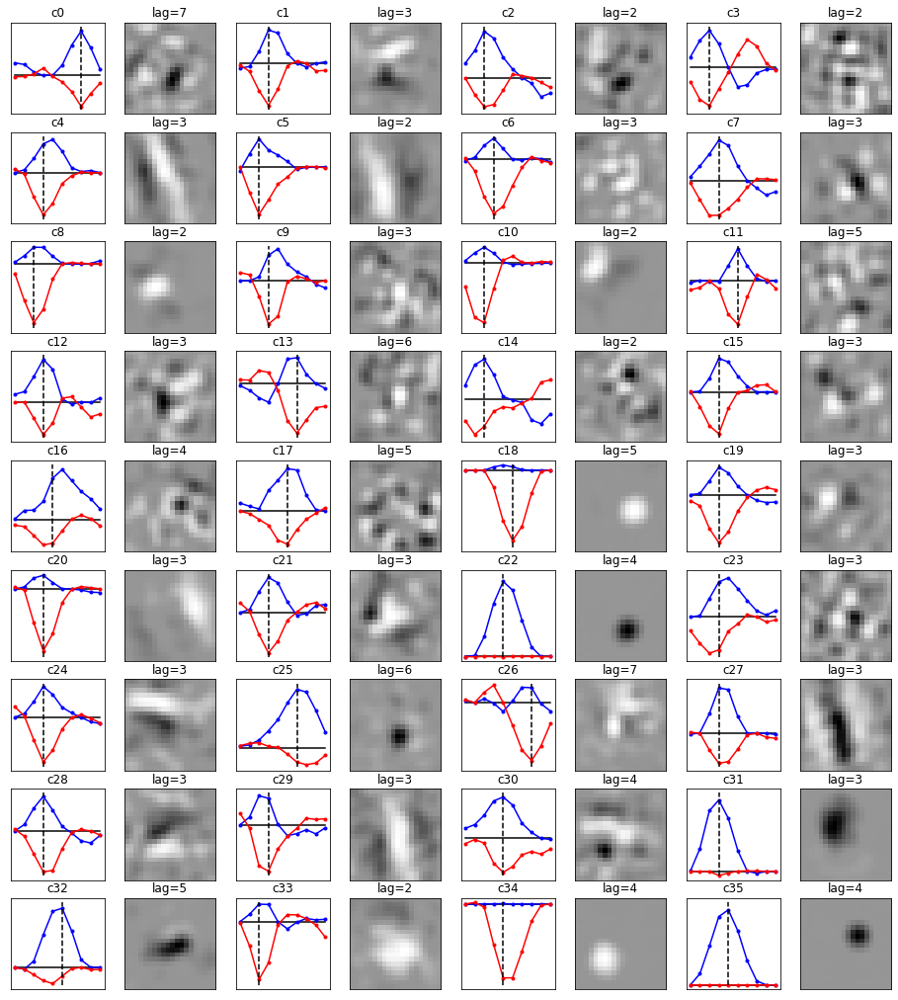

In [265]:
# get new stimulus model
side2c, Xstim, Rvalid, rinds, cids, Ui, Xi = get_stim_model(StimC, Robs, [NX,NY], valid=valdata, num_lags=10, plot=True,
        XTreg=0.02,L1reg=3e-3,MIreg=0.1,MSCreg=10.0,Greg=0.1,Mreg=1e-4)

DU.plot_3dfilters(side2c)

  0%|          | 0/25 [00:00<?, ?it/s]

[-1.95024784e+02 -1.78772719e+02 -1.62520653e+02 -1.46268588e+02
 -1.30016523e+02 -1.13764457e+02 -9.75123920e+01 -8.12603267e+01
 -6.50082614e+01 -4.87561960e+01 -3.25041307e+01 -1.62520653e+01
 -2.84217094e-14  1.62520653e+01  3.25041307e+01  4.87561960e+01
  6.50082614e+01  8.12603267e+01  9.75123920e+01  1.13764457e+02
  1.30016523e+02  1.46268588e+02  1.62520653e+02  1.78772719e+02
  1.95024784e+02]


100%|██████████| 25/25 [40:08<00:00, 96.35s/it] 


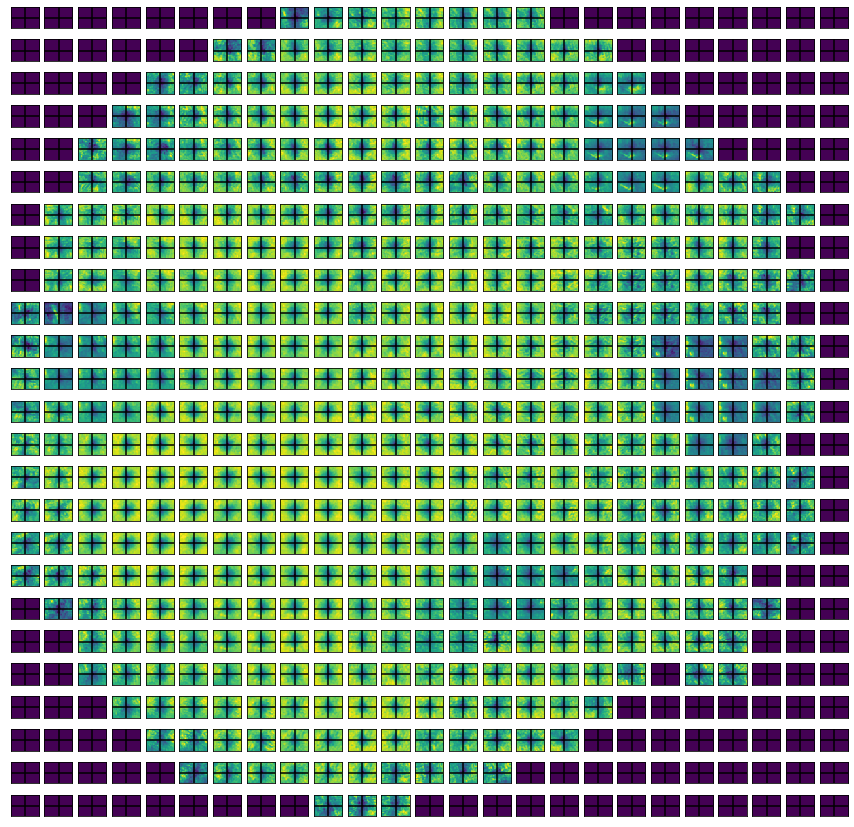

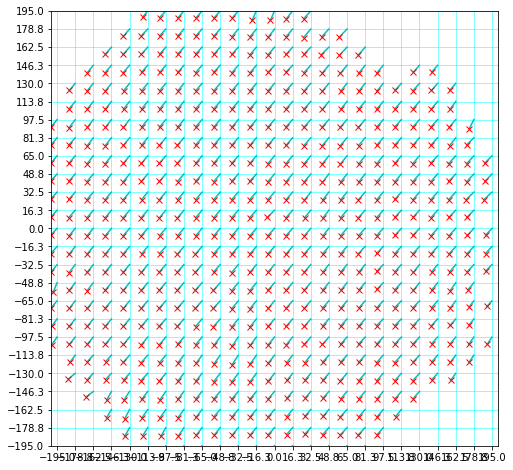

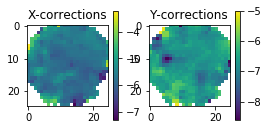

In [277]:
newEyeAtFrame = np.asarray([eyeX*ppd + xshift, eyeY*ppd + yshift]).T

centers5, locs, LLspace1 = get_corr_grid(side2c, StimC, Robs, [NX,NY], cids,
        newEyeAtFrame, valid, valid_eye_rad=5.2*ppd, Erad=0.75*ppd, Npos=25,
        crop_edge=3, plot=True, interpolation_steps=1, softmax=10)

In [181]:
# Check likelihood map for models fit to all data (this should hopefully be centered at 0) -- ORIGINAL (XstimL)
x0 = 1.0
y0 = 1.0
Erad = 0.75 # d.v.a

rs = np.hypot(eyeX-x0, eyeY-y0)

valE = np.where(rs < Erad)[0]

valtot = np.intersect1d(valdata, valE)

num_lags = base_mod.network_list[0]['input_dims'][-1]

10

In [24]:
# prepare for eye-tracking
num_lags = base_mod.network_list[0]['input_dims'][-1]
# recreate full Xstim
Xstim = NDNutils.create_time_embedding(Stim, [num_lags, NX, NY], tent_spacing=1)

Rvalid = deepcopy(Robs[:,cids])
NC = Rvalid.shape[1]

# base_mod = NDN.NDN.load_model('/home/dbutts/Marmo/pkls/d1231csn0.pkl')
base_mod = side2b.copy_model()
netlist_old = deepcopy(base_mod.network_list)[0]



In [68]:
base_mod = side2b.copy_model()
netlist_old = deepcopy(base_mod.network_list)[0]

# Scaffold model -- only the second network is non-convolutional
scaff_par = deepcopy(base_mod.network_list[0])
scaff_par['input_dims'] = [1, NX, NY] + [scaff_par['input_dims'][-1]]
scaff_par['layer_types']=['conv', 'conv']
scaff_par['conv_filter_widths'] = [netlist_old['input_dims'][1], 1] # base_mod 

# num_space = np.prod(netlist_old['input_dims'][1:3])
num_space = np.prod(cell_shift_mod.input_sizes[0][:-1])

side_par = deepcopy(base_mod.network_list[1])
side_par['layer_types'] = ['conv']
side_par['conv_filter_widths'] = [1]
# side_par['layer_sizes'][-1] = NC*NY*NX

cell_shift_mod = NDN.NDN( [scaff_par, side_par], ffnet_out=1, noise_dist='poisson' )
# copy first network verbatim (only thing diff is output is a convolution)
cell_shift_mod.networks[0].layers[0].weights = deepcopy(base_mod.networks[0].layers[0].weights)
cell_shift_mod.networks[0].layers[0].biases = deepcopy(base_mod.networks[0].layers[0].biases)
cell_shift_mod.networks[0].layers[1].weights = deepcopy(base_mod.networks[0].layers[1].weights)
cell_shift_mod.networks[0].layers[1].biases = deepcopy(base_mod.networks[0].layers[1].biases)
cell_shift_mod.networks[1].layers[0].weights = deepcopy(base_mod.networks[1].layers[0].weights)
cell_shift_mod.networks[1].layers[0].biases = deepcopy(base_mod.networks[1].layers[0].biases)

2030 valid samples in window
-3.594882208315802 4.823833745785883 0.10747356104377345


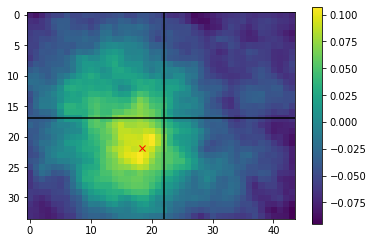

In [81]:
# Check likelihood map for models fit to all data (this should hopefully be centered at 0) -- ORIGINAL (XstimL)
x0 = 0.0
y0 = 0.0
Erad = 0.75 # d.v.a

rs = np.hypot(eyeX-x0, eyeY-y0)

valE = np.where(rs < Erad)[0]

valtot = np.intersect1d(valdata, valE)
print("%d valid samples in window" %len(valtot))

# mod2 = base_mod.copy_model()
# mod2.set_poisson_norm(Rvalid[valtot,:])

crop_edge=3 # number of pixels to crop

Rcc = conv_expand( Rvalid[valtot,:], num_space )
# preds = cell_shift_mod.generate_prediction(input_data=[Xstim[valtot,:]])

# Nspks = np.maximum(np.sum(Rcc,axis=0), 1)

# LLs = poiss_log_like(preds, Rcc) # poisson log-likelihood

LLs = cell_shift_mod.eval_models(input_data=[Xstim[valtot,:]], output_data=Rcc, nulladjusted=False)

LLsp = np.mean( np.reshape(LLs,[NY,NX,NC]), axis=2) # average across cells

tmp = LLsp[crop_edge:-crop_edge,:]
LLcrop = tmp[:,crop_edge:-crop_edge]
mL = np.max(LLcrop)

plt.imshow(LLcrop)
plt.colorbar()

# min1 = np.argmax(np.max(LLcrop,axis=0))
# min2 = np.argmax(np.max(LLcrop,axis=1))
LLcrop = normalize_range(LLcrop)
min1, min2 = radialcenter(LLcrop**6)

print(min1-NX//2+crop_edge,min2-NY//2+crop_edge, mL)


plt.axvline(NX//2-crop_edge, color='k')
plt.axhline(NY//2-crop_edge, color='k')
plt.plot(min1,min2,'rx')

plt.show()

In [83]:
locs = np.arange(-5,5,.5) # in d.v.a.
Npos = len(locs)
print(Npos, locs)

20 [-5.  -4.5 -4.  -3.5 -3.  -2.5 -2.  -1.5 -1.  -0.5  0.   0.5  1.   1.5
  2.   2.5  3.   3.5  4.   4.5]


In [89]:
from tqdm import tqdm

# Calculate LL-surface at each position
Erad = 0.75 # in d.v.a
crop_edge = 3 # in pixels

LLspace1 = np.zeros([Npos,Npos,NY-2*crop_edge,NX-2*crop_edge])

# Loop over positions
for xx in tqdm(range(Npos)):
    for yy in range(Npos):

        # get index for when the eye position was withing the boundaries
        rs = np.hypot(eyeX-locs[xx], eyeY-locs[yy])
        valE = np.where(rs < Erad)[0]
        valtot = np.intersect1d(valdata, valE)
        
        if len(valtot) > 100: # at least 100 samples to evaluate a likelihood
            
            Rcc = conv_expand( Rvalid[valtot,:], num_space )
#             cell_shift_mod.set_poisson_norm(Rvalid[valtot,:])
#             preds = cell_shift_mod.generate_prediction(input_data=[Xstim[valtot,:]])
#             LLcc = np.reshape(poiss_log_like(preds, Rcc), [NY,NX,NC])

            LLs = cell_shift_mod.eval_models(input_data=[Xstim[valtot,:]], output_data=Rcc, nulladjusted=False)
    
            LLcc = np.reshape(LLs, [NY,NX,NC])
    
            LLpos = np.mean(LLcc,axis=2)
            if crop_edge == 0:
                LLspace1[xx,yy,:,:] = deepcopy(LLpos)
            else:
                LLspace1[xx,yy,:,:] = deepcopy(LLpos)[crop_edge:-crop_edge,:][:,crop_edge:-crop_edge]

100%|██████████| 20/20 [41:25<00:00, 124.27s/it]


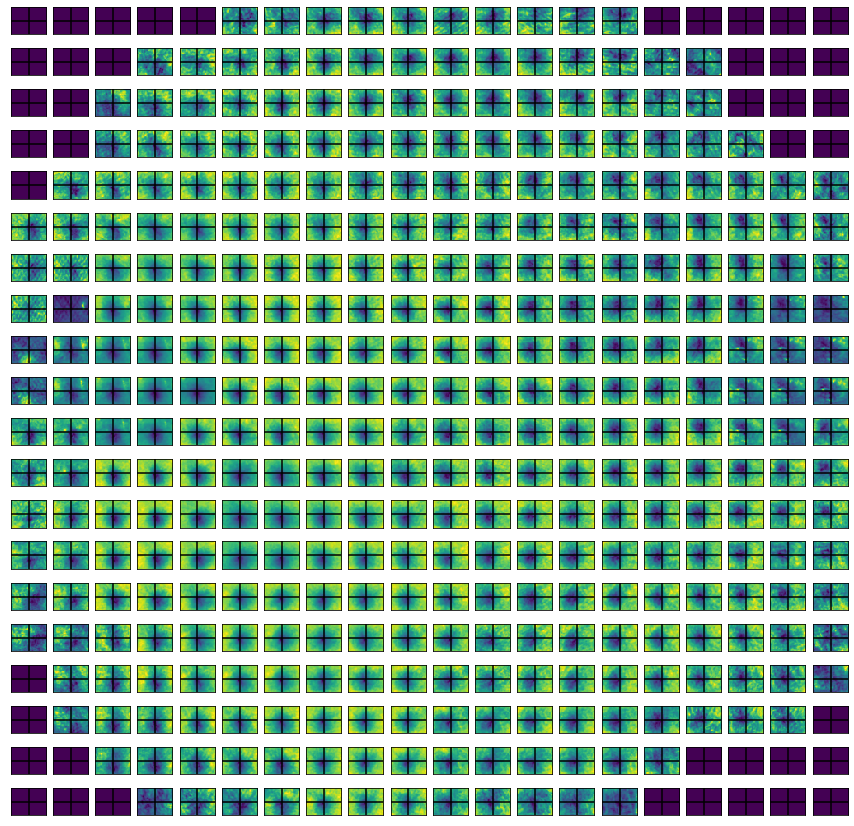

In [90]:
plt.figure(figsize=(15,15))

for xx in range(Npos):
    for yy in range(Npos):
        if LLspace1[xx][yy] is not None:
            ax = plt.subplot(Npos,Npos,yy*Npos+xx+1)
            plt.imshow(LLspace1[xx,yy,:,:])
            plt.axvline(NX//2-crop_edge, color='k')
            plt.axhline(NY//2-crop_edge, color='k')
            
            ax.set_xticks([])
            ax.set_yticks([])

plt.show()

In [127]:
def LLinterpolate(LLspace1):
    # smooth within across LLsurfaces
    LLspace3 = deepcopy(LLspace1)
    wsp = 0.5 # how much to weight neighboring LL surfaces
    for xx in range(Npos):
        for yy in range(Npos):
            Lsm = LLsmoother(LLspace1[xx,yy,:,:])
            if xx > 0:
                LLspace3[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx-1,yy,:,:],2)
            if yy > 0:
                LLspace3[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx,yy-1,:,:],2)
            if xx < Npos-1:
                LLspace3[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx+1,yy,:,:],2)
            if yy < Npos-1:
                LLspace3[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx,yy+1,:,:],2)
    return LLspace3
            

In [128]:
LLspace2 = LLinterpolate(LLspace1)
LLspace3 = LLinterpolate(LLspace2)

In [131]:
# compute likelihood map centers
centers5 = np.zeros([Npos,Npos,2])
for xx in range(Npos):
    for yy in range(Npos):
            I = deepcopy(LLspace3[xx,yy,1:-1,1:-1])
            I = 1-normalize_range(I)
            
            min1,min2 = radialcenter(I**10) # softmax center
            
            centers5[xx,yy,:] = [(min1-NX//2+crop_edge)/ppd, (min2-NY//2+crop_edge)/ppd]

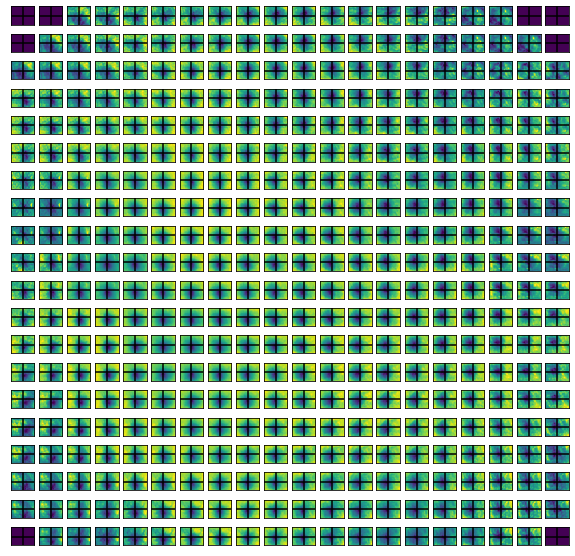

In [130]:
plt.figure(figsize=(10,10))

for xx in range(Npos):
    for yy in range(Npos):
        if LLspace3[xx][yy] is not None:
            ax = plt.subplot(Npos,Npos,yy*Npos+xx+1)
            plt.imshow(LLspace3[xx,yy,:,:])
            plt.axvline(NX//2-crop_edge, color='k')
            plt.axhline(NY//2-crop_edge, color='k')
            
            ax.set_xticks([])
            ax.set_yticks([])

plt.show()

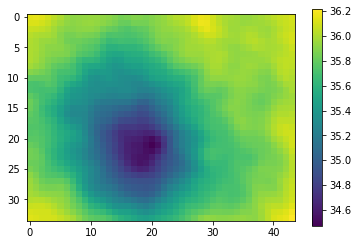

In [132]:
plt.imshow(LLspace3[10,10,:,:])
plt.colorbar()

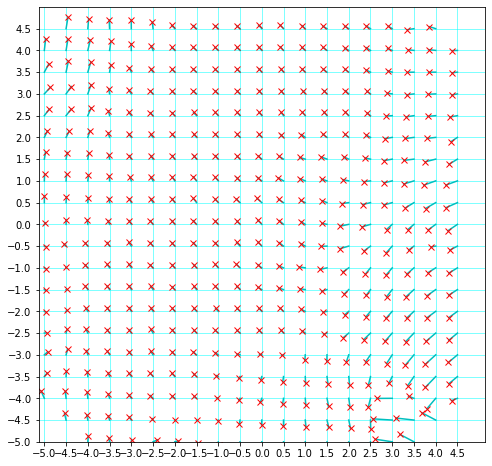

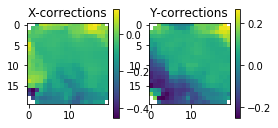

In [133]:
fig = plt.figure(figsize=(8,8))
ax = fig.gca()
for xx in range(Npos):
    for yy in range(Npos):
        plt.plot([locs[xx],centers5[xx,yy,0]+locs[xx]], [locs[yy], centers5[xx,yy,1]+locs[yy]],'c')
        plt.plot(centers5[xx,yy,0]+locs[xx], centers5[xx,yy,1]+locs[yy],'rx')
plt.axis('equal')

plt.xlim([-5,5])
plt.ylim([-5,5])
ax.set_xticks(locs)
ax.set_yticks(locs)
ax.grid()
ax.grid(linestyle='-', linewidth='0.5', color='cyan')
plt.show()

plt.figure(figsize=(4,2))
plt.subplot(1,2,1)
plt.imshow(centers5[:,:,0])
plt.colorbar()
plt.title('X-corrections')
plt.subplot(1,2,2)
plt.imshow(centers5[:,:,1])
plt.colorbar()
plt.title('Y-corrections')
plt.show()

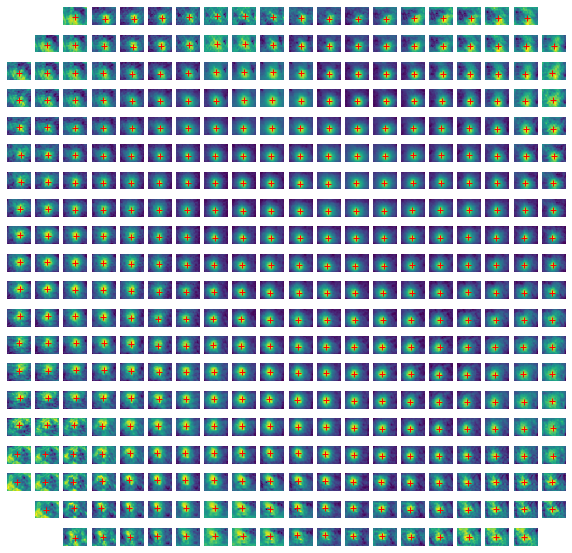

In [136]:
plt.figure(figsize=(10,10))
for xx in range(Npos):
    for yy in range(Npos):
        plt.subplot(Npos,Npos,xx*Npos + yy + 1)

        I = deepcopy(LLspace3[xx,yy,1:-1,1:-1])
        I = 1-normalize_range(I)

        plt.imshow(I)
        xc,yc=radialcenter(I**2)
        plt.plot(xc, yc, '+r')
        plt.axis("off")



In [152]:
corrgrid = deepcopy(centers5)
maxshift = 0.2

a = np.where(corrgrid > maxshift)
corrgrid[a] = maxshift
b = np.where(corrgrid < -maxshift)
corrgrid[b] = -maxshift

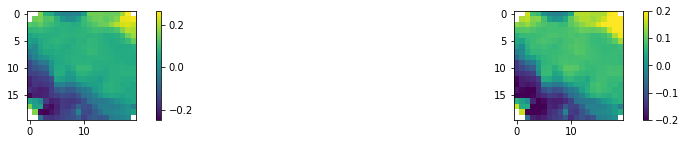

In [153]:
DU.subplot_setup(1,2)
plt.subplot(1,2,1)
plt.imshow(centers5[:,:,1])
plt.colorbar()
plt.subplot(1,2,2)
plt.imshow(corrgrid[:,:,1])
plt.colorbar()
plt.show()

In [154]:
corrgrid[np.isnan(corrgrid)] = 0
coords = np.zeros([Npos*Npos,4])
nn = 0
for xx in range(Npos):
    for yy in range(Npos):
        coords[nn,:] = [locs[xx], locs[yy], corrgrid[xx,yy,0], corrgrid[xx,yy,1]]
        nn += 1
        

In [155]:
scx = deepcopy(eyeX)
scy = deepcopy(eyeY)

In [156]:
from scipy.interpolate import LinearNDInterpolator,interp2d

In [157]:
aloc = np.asarray(locs)
# xcorrec = interp2d(aloc, aloc,corrgrid[:,:,0], kind='linear')
# ycorrec = interp2d(aloc, aloc,corrgrid[:,:,1], kind='linear')

# xcorrec = interp2d(coords[:,0], coords[:,1],coords[:,2], kind='linear')
# ycorrec = interp2d(coords[:,0], coords[:,1],coords[:,3], kind='linear')

xcorrec = LinearNDInterpolator(coords[:,0:2], coords[:,2])
ycorrec = LinearNDInterpolator(coords[:,0:2], coords[:,3])

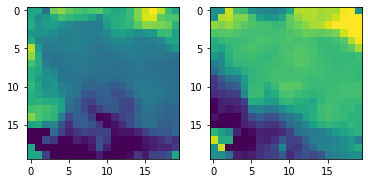

In [158]:
# xcorrec(eyeX, eyeY)
plt.subplot(121)
plt.imshow(np.reshape(xcorrec(coords[:,0], coords[:,1]), (Npos,Npos)))
plt.subplot(122)
plt.imshow(np.reshape(ycorrec(coords[:,0], coords[:,1]), (Npos,Npos)))


(0, 1000)

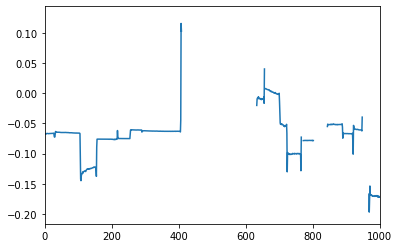

In [159]:
plt.plot(xcorrec(eyeX, eyeY))
plt.xlim((0, 1000))
# xcorrec(eyeX[0:2], eyeY[0:2])

In [182]:
xshift = xcorrec(eyeX, eyeY)
yshift = ycorrec(eyeX, eyeY)

ix = np.logical_or(np.isnan(xshift), np.isnan(yshift))

xshift[ix] = 0.0
yshift[ix] = 0.0

from tqdm import tqdm

In [183]:
StimC = deepcopy(Stim)
NT = StimC.shape[0]

xax = np.arange(0,NX,1) - NX/2
yax = np.arange(0,NY,1) - NY/2

for iFrame in tqdm(range(NT)):
    I = np.reshape(Stim[iFrame,:], (NY, NX))
#     plt.subplot(1,2,1)
#     plt.imshow(I)

    imshifter = interp2d(xax, yax, I)
# plt.subplot(1,2,2)
# plt.imshow(
    StimC[iFrame,:] = imshifter(xax+xshift[iFrame],yax+yshift[iFrame]).flatten()


100%|██████████| 123751/123751 [00:14<00:00, 8363.10it/s]


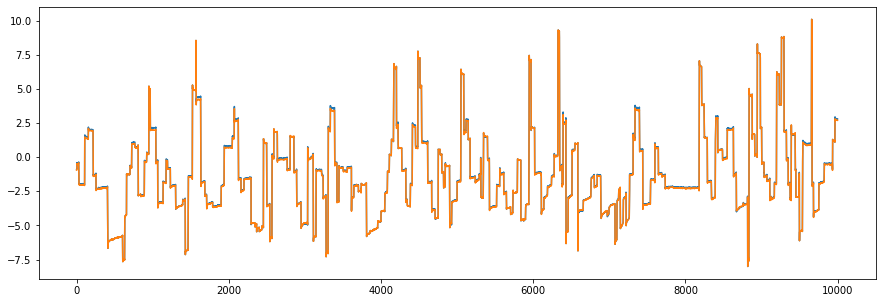

In [184]:
# clean up some variables
# %matplotlib notebook 
plt.figure(figsize=(15,5))
ix = range(10000)
plt.plot(eyeX[ix])
plt.plot(eyeX[ix]+xshift[ix])

72291 valid samples of 123751 possible


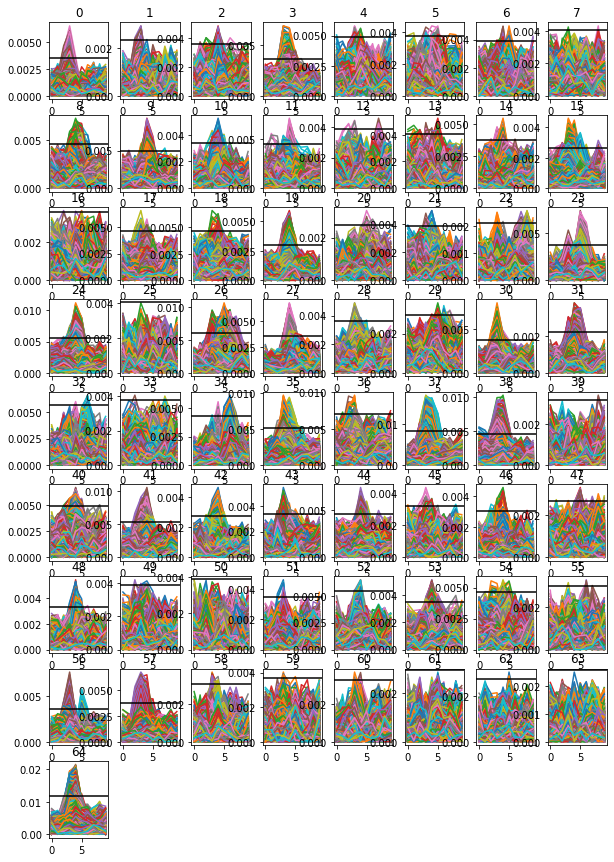

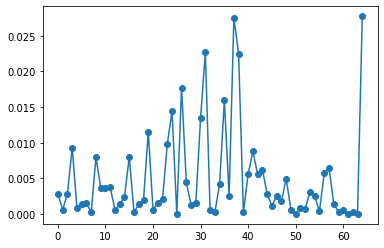

In [185]:
num_lags = 10
NC = Robs.shape[1]
Xstim, rinds = create_time_embedding_valid(StimC, [num_lags, NX, NY], valdata)
Rvalid = deepcopy(Robs[rinds,:])

valid = np.where(np.sum(np.isnan(Xstim), axis=1)==0)[0]
Xstim = Xstim[valid,:]
Rvalid = Rvalid[valid,:]

NT = Rvalid.shape[0]
print('%d valid samples of %d possible' %(NT, Stim.shape[0]))

stas = Xstim.T@(Rvalid - np.average(Rvalid, axis=0))
stas = np.reshape(stas, [NX*NY,num_lags, NC])/Rvalid.shape[0]

# check STAs: is there signal?
plt.figure(figsize=(10,15))
sx,sy = U.get_subplot_dims(NC)

mu = np.zeros(NC)
for cc in range(NC):
    plt.subplot(sx,sy,cc+1)
    plt.plot(np.abs(np.transpose(stas[:,:,cc])))
    t = np.median(abs(stas[:,:,cc]-np.average(stas[:,:,cc])))*6
    mu[cc] = np.average(np.abs(stas[:,:,cc])>t)
    plt.axhline(t, color='k')
    plt.title(cc)

plt.figure()
plt.plot(mu, '-o')
plt.show()
    

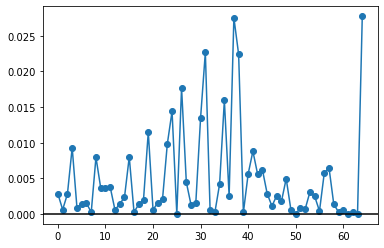

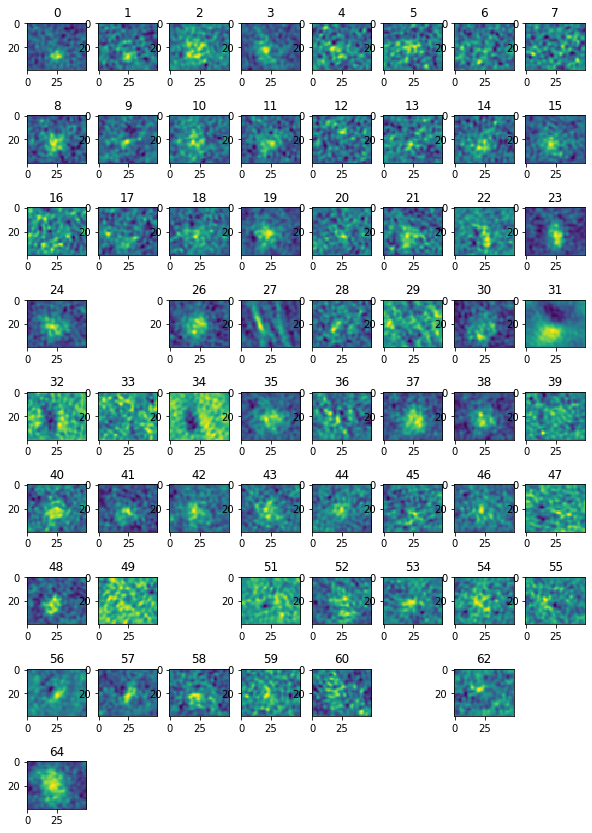

In [186]:
# threshold good STAS
thresh = 0.00
plt.figure()
plt.plot(mu, '-o')

plt.axhline(thresh, color='k')

cids = np.where(mu > thresh)[0]
plt.figure(figsize=(10,15))
for cc in cids:#range(NC):
    plt.subplot(sx,sy,cc+1)
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], (NY,NX)))
    plt.title(cc)


In [ ]:
# garbage collection (amazing!)
import gc
gc.enable()
gc.collect()

In [241]:
# gc.collect()


76161